# Resumé du projet - Segmentez des clients d'un site e-commerce

Olist souhaite que vous fournissiez à ses équipes d'e-commerce une segmentation des clients qu’elles pourront utiliser au quotidien pour leurs campagnes de communication.

## Objetifs
- Comprendre les différents types d’utilisateurs grâce à leur comportement et à leurs données personnelles.

## Fournir à l’équipe marketing
- Description actionable de votre segmentation et de sa logique sous-jacente pour une utilisation optimale
- Proposition de contrat de maintenance basée sur une analyse de la stabilité des segments au cours du temps.

## Demande du client:
- La segmentation proposée doit être exploitable et facile d’utilisation pour l’équipe marketing.
- Vous évaluerez la fréquence à laquelle la segmentation doit être mise à jour, afin de pouvoir effectuer un devis de contrat de maintenance.
- Le code fourni doit respecter la convention PEP8, pour être utilisable par Olist.

Pour cette mission, on utilise une base de données anonymisée comportant des informations sur l’historique de commandes depuis janvier 2017. Cette base de données est fournit par Olist, une solution de vente sur les marketplaces en ligne.

## Method
Pour soutenir notre client dans son projet de segmentation de la clientèle, nous avons appliqué la méthode suivante:


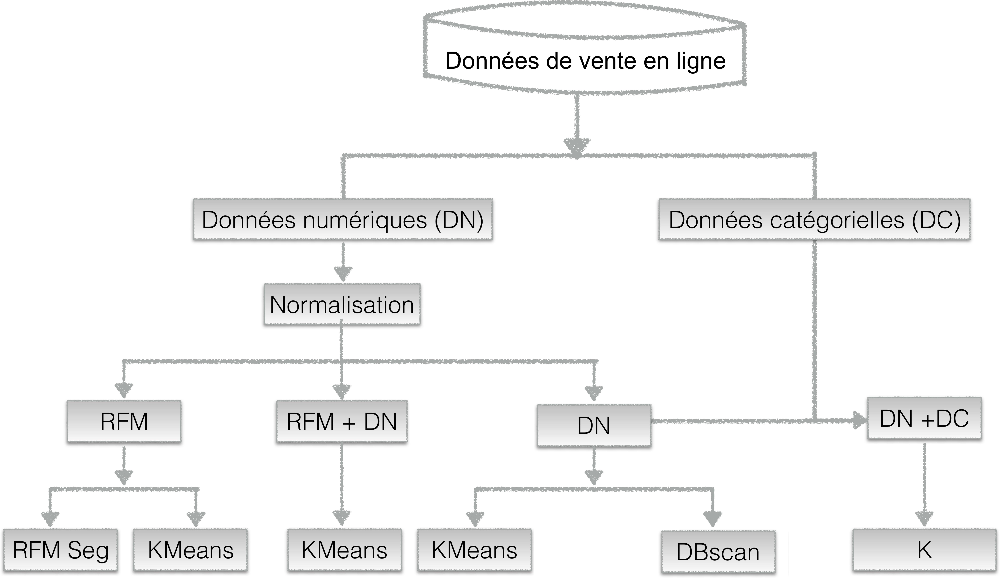

In [1]:
from IPython.display import Image
Image(filename = str("Projet_summary.png"), width=1500, height=1500)

# Chargement des bibliothèques nécessaires

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import numpy as np
import copy
import seaborn as sns
import os
import shutil
import plotly.graph_objects as go
import re
import squarify
import sklearn.metrics as metrics
import warnings
warnings.simplefilter(action='ignore', category=Warning)

from pathlib import Path
from functools import reduce
from datetime import timedelta

from sklearn import decomposition
from sklearn import preprocessing 
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors

from yellowbrick.cluster import KElbowVisualizer
from yellowbrick.cluster import InterclusterDistance
from yellowbrick.cluster import intercluster_distance

from matplotlib.colors import ListedColormap

from sklearn.preprocessing import OrdinalEncoder
from sklearn.metrics.cluster import adjusted_rand_score
 
from sklearn.model_selection import train_test_split

from kmodes.kprototypes import KPrototypes
import time

## Fonctions utilisées

In [3]:
def df_merge_RFM_level(df):
    if df['RFM_Score'] >= 12:
        return 'Champions'
    elif ((df['RFM_Score'] >= 10) and (df['RFM_Score'] < 12)):
        return 'Loyal'
    elif ((df['RFM_Score'] >= 8) and (df['RFM_Score'] < 10)):
        return 'Need attention'
    elif ((df['RFM_Score'] >= 6) and (df['RFM_Score'] <8)):
        return 'At risk'
    else:
        return 'Lost'

def find_optimal_K(rstate,df):
    #
    visualizer = KElbowVisualizer(KMeans(random_state=rstate))
    visualizer.fit(df)
    visualizer.show() 
    
    # Trouver le nombre optimal de clusters
    nclusters= visualizer.__dict__['elbow_value_']
    
    #Utilisation de l'analyse en composantes principales pour visualiser les clusters
    intercluster_distance(KMeans(nclusters), 
                      df, 
                      embedding='tsne', 
                      random_state=rstate)
    return nclusters

def X_selection_Standardize_features(df):
    
    plt.rc('font', size=15)
    df=df.select_dtypes(exclude=['object',"datetime64[ns]"])
    df.plot(kind='density',sharex=True,figsize=(15,5),layout=(10,1),label=True)
    plt.title(['Before scale'])
    feat_cols=df.columns
    scaler = preprocessing.StandardScaler().fit(df)
    df_x_norm =  scaler.transform(df)
    df_x_norm = pd.DataFrame(data=df_x_norm,index=df.index,columns=df.columns)
    df_x_norm.plot(kind='density',sharex=True,figsize=(15,5),layout=(10,1),label=True)
    plt.title(['After scale'])
    return df_x_norm, feat_cols

def final_KMeans_model_stab(df,nclusters,nstate):
    kmeans_visualizer = KMeans(n_clusters=nclusters,random_state=nstate)
    kmeans_visualizer.fit(df)
    name='Cluster = '+str(nclusters)
    df[name]=kmeans_visualizer.predict(df)
    labels =kmeans_visualizer.labels_
    centers=kmeans_visualizer.cluster_centers_
    return df,labels,centers,name  

def final_KMeans_model(df,nclusters,nstate):
    kmeans_visualizer = KMeans(n_clusters=nclusters,random_state=nstate)
    model=kmeans_visualizer.fit(df)
    name='Cluster = '+str(nclusters)
    df[name]=kmeans_visualizer.predict(df)
    labels =kmeans_visualizer.labels_
    centers=kmeans_visualizer.cluster_centers_
    return df,labels,centers,name  

def plot_radar(df,fig,ax,index,i,name,palette,kx):
    plt.rc('font', size=15)
    labels = df[1:].columns                                    
    if ax[i]==ax[0]:
        index = df.index 
    num_vars = len(labels)                                                
    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist() 
    angles += angles[:1]                                                  
   
    for knx in df.index:
        add_to_radar(df,knx, palette[knx],angles,labels,ax[i],fig,kx)
        ax[i].legend(loc='upper right', bbox_to_anchor=(0.1, 0.1),labels=index)
        ax[i].set_title(name,fontsize=18,fontweight="bold")
    

def pca_dim_reduction(df,var_explaned,figure_name ):
    pcamodel=decomposition.PCA(var_explaned)
    pcamodel.fit(df)
    explained_var=pcamodel.explained_variance_ratio_
    explained=pcamodel.explained_variance_ratio_.cumsum()
    loadings = pcamodel.components_
    num_pc = len(pcamodel.components_) 
    pc_list = ["PC"+str(i) for i in list(range(1, num_pc+1))]
#
    loadings_df = pd.DataFrame.from_dict(dict(zip(pc_list, loadings)))
    loadings_df['variable'] = df.columns.values
    loadings_df = loadings_df.set_index('variable')
    
    df_dim_red=pcamodel.transform(df)
    df_dim_red = pd.DataFrame(data=df_dim_red, columns=pc_list)

    plt.rc('font', size=15)
    fig, ax = plt.subplots(1,2,figsize=(12,5))
    fig.subplots_adjust(right=1.2)
#
    sns.heatmap(loadings_df,vmin=-1,vmax=1, ax=ax[0], annot=True, cmap='Spectral')
#
    display_scree_plot(pcamodel,pc_list,ax[1])
    
    plt.savefig(figure_name,format='jpeg',dpi=100,bbox_inches='tight')
    
    return df_dim_red,pcamodel

def stability_measure(nclusters,df):
    inx=0
    inx0=0
    inj=0
    df_stability_train=pd.DataFrame()
    #
    for knx in range(0,nclusters*2): 
        knx=nclusters
        kmeans_visualizer = KMeans(n_clusters=knx,init='random')
        kmeans_visualizer.fit(df)
        name1='Iteration  '+str(inj)
        df_stability_train[name1]=kmeans_visualizer.predict(df)
    
        inj0=inj-1
        if inj==0:
            name0=name1
            inj0=inj
        ARI_RFM_KMeans_train=adjusted_rand_score(df_stability_train[name1],df_stability_train[name0])
        print('ARI  '+ str(name1) + ' - ' + str(name0)+' = ' , round(ARI_RFM_KMeans_train,2)) 
        name0=name1
        inj=inj+1  
    return df_stability_train

def myplot(data,x_scaled,name1,pca,dim,boundary,alpha,figure_name,labels=None):
    
    fig, ax = plt.subplots(figsize=(15,8))
    plt.rc('font', size=15)
    d1=dim[0]
    d2=dim[1]
    c=x_scaled[name1]
    coeff=np.transpose(pca.components_[d1:d2+1, :])
    score=data.values 
    xs = score[:,d1]
    ys = score[:,d2]
    n = coeff.shape[0]
    value=np.unique(c)
    scalex = 1.0/(xs.max() - xs.min())
    scaley = 1.0/(ys.max() - ys.min())
    ass=ax.scatter(xs * scalex,ys * scaley,c=c.astype(float),cmap='Paired',s=50, alpha=alpha)
    ax.set_xlim([-boundary,boundary])
    ax.set_ylim([-boundary,boundary])
    legend1 = ax.legend(*ass.legend_elements(),
                    bbox_to_anchor=(1.05, 1),loc="upper left", title=name1)
    ax.add_artist(legend1)
    for i in range(n):
        ax.arrow(0, 0, coeff[i,0], coeff[i,1],color = 'black',alpha = 0.5)
        if labels is None:
            ax.text(coeff[i,0]* 1.2, coeff[i,1] * 1.15, "Var"+str(i+1), color = 'black', ha = 'center', va = 'center')
        else:
            ax.text(coeff[i,0]* 1.2, coeff[i,1] * 1.15, labels[i], color = 'black', ha = 'center', va = 'center')
 
    ax.set_xlabel("PC{} ({}%)".format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
    ax.set_ylabel("PC{} ({}%)".format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))
       
    ax.axvline(0,color='grey', ls='--') 
    ax.axhline(0,color='grey', ls='--')
    ax.grid()
    
    
    plt.savefig(figure_name,format='jpeg',dpi=100,bbox_inches='tight')
    
def display_scree_plot(pca,pc_list,ax):
    plt.rc('font', size=15)    
    scree = pca.explained_variance_ratio_*100
    ax.bar(pc_list, scree, alpha=0.5, align='center', label='individual explained variance')
    ax.step(pc_list,  scree.cumsum(),c="red",marker='o',where= 'mid', label='cumulative explained variance')
    ax.set_xlabel("PCs")
    ax.set_ylabel("Ratio de la variance expliqué")
    plt.legend(loc = 'best')
    
    print(scree.cumsum())
    
def nombre_client_segment(segments_counts,fig,ax,name,figure_name):
    plt.rc('font', size=15)
    bars = ax.barh(range(len(segments_counts)),
              segments_counts,
              color='silver')
    ax.set_frame_on(False)
    ax.tick_params(left=False,
               bottom=False,
               labelbottom=False)
    ax.set_yticks(range(len(segments_counts)))
    ax.set_yticklabels(segments_counts.index)
    ax.set_title(name,fontweight="bold")
    
    for i, bar in enumerate(bars):
        value = bar.get_width()
        if segments_counts.index[i] in ['Champions','Need attention', 'Loyal']:
            bar.set_color('green')
        ax.text(value,
                bar.get_y() + bar.get_height()/2,
                '{:,} ({:}%)'.format(int(value),
                                   int(value*100/segments_counts.sum())),
                va='center',
                ha='left'
               )
    plt.savefig(figure_name,format='jpeg',dpi=100,bbox_inches='tight')

def boxplot_plot(df, varname,xx,yy,valuevar,place,linewidthy,xlabell,miny,maxy,melt):
    plt.rc('font', size=15)
    if melt==1:
        gfg = sns.boxplot(x=xx, y=yy, data=df[df[varname]==valuevar],ax=place,linewidth=linewidthy,color='#ff9900')
        gfg.set(xlabel = xlabell, ylabel = valuevar)
    else:
        gfg = sns.boxplot(x=xx, y=yy, data=df,ax=place,linewidth=linewidthy,color='#ff9900')
        gfg.set(xlabel = xlabell, ylabel = valuevar)
        gfg.set(ylim=(miny, maxy))
    
def add_to_radar(df, cluster, color,angles,labels,ax,fig,kx):
    values = df.loc[cluster].tolist()
    values += values[:1]
    if kx==0:
        plt.rc('font', size=15)     
        plt.plot(angles, values, color=color, linewidth=1, label=cluster)
        plt.fill(angles, values, color=color, alpha=0.25)
        plt.set_theta_offset(np.pi / 2)
        plt.set_theta_direction(-1)

        plt.set_thetagrids(np.degrees(angles[:-1]), labels)
        for label, angle in zip(plt.get_xticklabels(), angles):
            if angle in (0, np.pi):
                label.set_horizontalalignment('center')
            elif 0 < angle < np.pi:
                label.set_horizontalalignment('left')
            else:
                label.set_horizontalalignment('right')
    else:
        ax.plot(angles, values, color=color, linewidth=1, label=cluster)
        ax.fill(angles, values, color=color, alpha=0.25)
        ax.set_theta_offset(np.pi / 2)
        ax.set_theta_direction(-1)

        ax.set_thetagrids(np.degrees(angles[:-1]), labels)
        for label, angle in zip(ax.get_xticklabels(), angles):
            if angle in (0, np.pi):
                label.set_horizontalalignment('center')
            elif 0 < angle < np.pi:
                label.set_horizontalalignment('left')
            else:
                label.set_horizontalalignment('right')

        
def plot_box_plot(df,xlabel_name,ylabel_name,figure_name):
    plt.rc('font', size=15)
    color = dict(boxes='black', whiskers='black', medians='red', caps='black')
    ax = df.plot.box(color=color,whiskerprops = dict(linestyle='-',linewidth=2.0, color='black'),figsize=(24, 8),fontsize=18)
    ax.set_xlabel(xlabel_name,fontsize=20)
    ax.set_ylabel(ylabel_name,fontsize=20)
    plt.grid(color='k', linestyle='-', linewidth=.1)
    plt.xticks(rotation=90)
    ax.label_outer() 
    
    
    plt.savefig(figure_name,format='jpeg',dpi=100,bbox_inches='tight')
    
def histplot_plot(fig,df_numerical,poss1,possi2,feat_idx):
    for feature in df_numerical.columns: 
        if df_numerical[feature].dtype == np.int64 or df_numerical[feature].dtype == np.float64:
            plt.rc('font', size=15)
            feat_idx=feat_idx
            ax = fig.add_subplot(poss1,possi2, (feat_idx+1))
            fig.subplots_adjust(left=0.1,bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.4)
            #% or count  a faire  ???????? densite true /false
            h = ax.hist(df_numerical[feature], bins=50, color='steelblue', edgecolor='none')
            ax.set_title(df_numerical.columns[feat_idx], fontsize=20)
            feat_idx=feat_idx+1
      
       
def plot_data_groupby(df_merge,states_selection,col_name,groupby,what_groupby,xlabel,ylabel,fig,\
                      scount,smean,ssum,axs,pos):
    for knx in col_name:
        title=str('State '+ knx)
        df1         =df_merge.loc[df_merge[states_selection]==knx]
        if scount==1:
            data_2_plot_plot = df1.groupby([groupby]).count()
        elif smean==1:
            data_2_plot_plot = df1.groupby([groupby]).mean()
        elif ssum==1:
            data_2_plot_plot = df1.groupby([groupby]).sum()
        plt.rc('font', size=15)
        Cust_charac=data_2_plot_plot.loc[:,data_2_plot_plot.columns.str.contains(what_groupby)]
        Cust_characanom=Cust_charac-Cust_charac.mean()
        
        Cust_charac.plot.bar(stacked=True,ax=axs[pos],fontsize=20).set_title(knx)
        
        pos=pos+1
    plt.ylabel(ylabel, fontsize=20)
    plt.xlabel(xlabel, fontsize=20)
    


# Constantes

In [4]:
var_explaned=0.75
pi=3.14
boundary=1
alpha=0.5
rstate=42

# Données utilisées

In [5]:
pd.set_option("display.precision", 2)          
pd.set_option("display.max.columns", None)    
pd.set_option("display.max.rows", None)

import os
for dirname, _, filenames in os.walk('../../DATA/P5'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

file= Path(str(dirname) + "/PROJET_DATA.csv")

dir_data = dirname 
dir_fig  = Path('../../FIGURES/P5')
dashbord_fig=Path('/home/yonss/AndroidStudioProjects/Dashboard/Images')

../../DATA/P5/olist_products_dataset.csv
../../DATA/P5/olist_geolocation_dataset.csv
../../DATA/P5/olist_order_reviews_dataset.csv
../../DATA/P5/olist_sellers_dataset.csv
../../DATA/P5/PROJET_DATA.csv
../../DATA/P5/product_category_name_translation.csv
../../DATA/P5/olist_order_payments_dataset.csv
../../DATA/P5/olist_orders_dataset.csv
../../DATA/P5/olist_order_items_dataset.csv
../../DATA/P5/olist_customers_dataset.csv


##  Lecture de données

In [6]:
# Lecture des fichier
df_merge = pd.read_csv(file)
if 'Unnamed: 0' in df_merge:
    df_merge=df_merge.drop(['Unnamed: 0'],axis=1)
df_merge.head()

,customer_id,order_purchase_timestamp,order_approved_at,payment_type,payment_value,review_score,review_answer_timestamp,product_category_name,customer_unique_id,customer_city,customer_state,geolocation_lat,geolocation_lng,DaysSinceOrder,DeliveryWaitingPeriod,review_creation_date,TimeSinceRevueCreation
0,3ce436f183e68e07877b285a838db11a,2017-09-13 08:59:02,2017-09-13 09:45:35,credit_card,4.28,5,2017-09-22 10:57:03,cool_stuff,871766c5855e863f6eccc05f988b23cb,campos dos goytacazes,RJ,-21.76,-41.31,5.86,7.58,1505952000000000000,32.47
1,e6eecc5a77de221464d1c4eaff0a9b64,2017-06-28 11:52:20,2017-06-29 02:44:11,boleto,4.30,5,2017-07-17 12:50:07,cool_stuff,0fb8e3eab2d3e79d92bb3fffbb97f188,jatai,GO,-17.89,-51.72,6.06,14.75,1499990400000000000,33.35
2,4ef55bf80f711b372afebcb7c715344a,2018-05-18 10:25:53,2018-05-18 12:31:43,credit_card,4.42,4,2018-06-06 21:41:12,cool_stuff,3419052c8c6b45daf79c1e426f9e9bcb,belo horizonte,MG,-19.92,-43.98,4.65,17.25,1528156800000000000,32.73
3,30407a72ad8b3f4df4d15369126b20c9,2017-08-01 18:38:42,2017-08-01 18:55:08,credit_card,4.32,5,2017-08-13 03:35:17,cool_stuff,e7c828d22c0682c1565252deefbe334d,sao jose dos pinhais,PR,-25.52,-49.12,5.98,8.11,1502323200000000000,33.24
4,91a792fef70ecd8cc69d3c7feb3d12da,2017-08-10 21:48:40,2017-08-10 22:05:11,credit_card,4.28,5,2017-08-28 00:51:18,cool_stuff,0bb98ba72dcc08e95f9d8cc434e9a2cc,conselheiro lafaiete,MG,-20.65,-43.79,5.95,13.92,1503619200000000000,33.20


In [7]:
df_merge.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45569 entries, 0 to 45568
Data columns (total 17 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   customer_id               45569 non-null  object 
 1   order_purchase_timestamp  45569 non-null  object 
 2   order_approved_at         45569 non-null  object 
 3   payment_type              45569 non-null  object 
 4   payment_value             45569 non-null  float64
 5   review_score              45569 non-null  int64  
 6   review_answer_timestamp   45569 non-null  object 
 7   product_category_name     45569 non-null  object 
 8   customer_unique_id        45569 non-null  object 
 9   customer_city             45569 non-null  object 
 10  customer_state            45569 non-null  object 
 11  geolocation_lat           45569 non-null  float64
 12  geolocation_lng           45569 non-null  float64
 13  DaysSinceOrder            45569 non-null  float64
 14  Delive

In [8]:
df_merge.head()

,customer_id,order_purchase_timestamp,order_approved_at,payment_type,payment_value,review_score,review_answer_timestamp,product_category_name,customer_unique_id,customer_city,customer_state,geolocation_lat,geolocation_lng,DaysSinceOrder,DeliveryWaitingPeriod,review_creation_date,TimeSinceRevueCreation
0,3ce436f183e68e07877b285a838db11a,2017-09-13 08:59:02,2017-09-13 09:45:35,credit_card,4.28,5,2017-09-22 10:57:03,cool_stuff,871766c5855e863f6eccc05f988b23cb,campos dos goytacazes,RJ,-21.76,-41.31,5.86,7.58,1505952000000000000,32.47
1,e6eecc5a77de221464d1c4eaff0a9b64,2017-06-28 11:52:20,2017-06-29 02:44:11,boleto,4.30,5,2017-07-17 12:50:07,cool_stuff,0fb8e3eab2d3e79d92bb3fffbb97f188,jatai,GO,-17.89,-51.72,6.06,14.75,1499990400000000000,33.35
2,4ef55bf80f711b372afebcb7c715344a,2018-05-18 10:25:53,2018-05-18 12:31:43,credit_card,4.42,4,2018-06-06 21:41:12,cool_stuff,3419052c8c6b45daf79c1e426f9e9bcb,belo horizonte,MG,-19.92,-43.98,4.65,17.25,1528156800000000000,32.73
3,30407a72ad8b3f4df4d15369126b20c9,2017-08-01 18:38:42,2017-08-01 18:55:08,credit_card,4.32,5,2017-08-13 03:35:17,cool_stuff,e7c828d22c0682c1565252deefbe334d,sao jose dos pinhais,PR,-25.52,-49.12,5.98,8.11,1502323200000000000,33.24
4,91a792fef70ecd8cc69d3c7feb3d12da,2017-08-10 21:48:40,2017-08-10 22:05:11,credit_card,4.28,5,2017-08-28 00:51:18,cool_stuff,0bb98ba72dcc08e95f9d8cc434e9a2cc,conselheiro lafaiete,MG,-20.65,-43.79,5.95,13.92,1503619200000000000,33.20


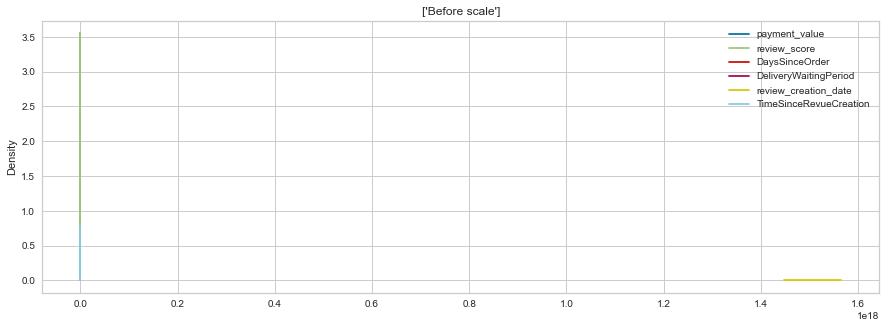

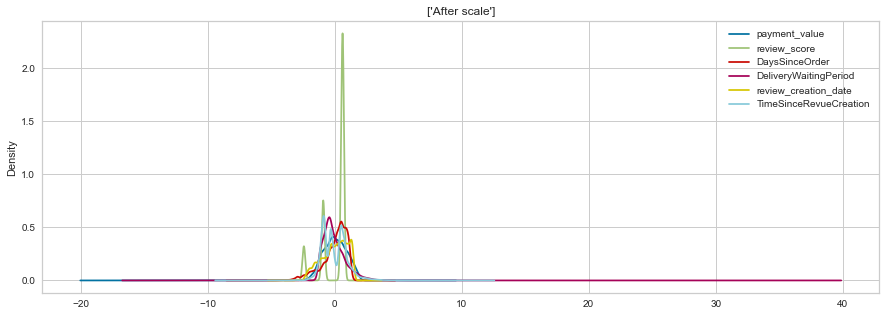

In [9]:
df_merge_num=copy.deepcopy(df_merge)
df_merge_num=df_merge_num.drop(['geolocation_lat', 'geolocation_lng'],axis=1)
plt.rc('font', size=20)
[df_merge_num,feat_cols] = X_selection_Standardize_features(df_merge_num)
df_merge[feat_cols]=df_merge_num[feat_cols] 

In [10]:
df_merge.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45569 entries, 0 to 45568
Data columns (total 17 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   customer_id               45569 non-null  object 
 1   order_purchase_timestamp  45569 non-null  object 
 2   order_approved_at         45569 non-null  object 
 3   payment_type              45569 non-null  object 
 4   payment_value             45569 non-null  float64
 5   review_score              45569 non-null  float64
 6   review_answer_timestamp   45569 non-null  object 
 7   product_category_name     45569 non-null  object 
 8   customer_unique_id        45569 non-null  object 
 9   customer_city             45569 non-null  object 
 10  customer_state            45569 non-null  object 
 11  geolocation_lat           45569 non-null  float64
 12  geolocation_lng           45569 non-null  float64
 13  DaysSinceOrder            45569 non-null  float64
 14  Delive

# Analyse exploratoire

## Estimation de Recence , Fréquence et Montant 


In [11]:
df_merge['order_approved_at']=pd.to_datetime(df_merge['order_approved_at'])
   
aggr = {
     'DaysSinceOrder'   : lambda x: x.min(),  
     'order_approved_at': lambda x: x.count(), 
     'payment_value'    : lambda x: x.sum(),  
     }

df_merge_RFM = df_merge.groupby('customer_id').agg(aggr) 

df_merge_RFM.rename(columns={'DaysSinceOrder': 'Recence', 
                         'order_approved_at': 'Fréquence', 
                         'payment_value': 'Montant',
                         }, inplace=True)


In [12]:
df_merge_RFM = pd.merge(df_merge,df_merge_RFM,  on="customer_id", how="right")
df_merge_RFM.drop_duplicates(subset="customer_id", inplace=True)

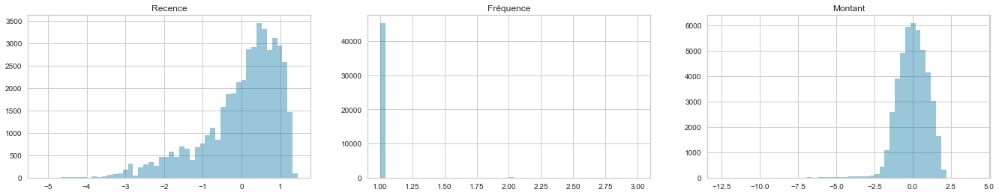

In [13]:
figure_name='RFM_dist.jpeg'
f, axes = plt.subplots(1, 3, figsize=(23, 4))

inx=0
plt.rc('font', size=20)
for knx in ['Recence','Fréquence','Montant']:

    data=copy.deepcopy(df_merge_RFM)
    data=data.drop(data.columns.difference([knx]),axis=1)
    sns.distplot(data,ax=axes[inx],kde=False).set_title(knx)
    inx=inx+1

figure_name='RFM_dist.jpeg'

plt.savefig(figure_name,format='jpeg',dpi=100,bbox_inches='tight')

!cp RFM_dist.jpeg /home/yonss/AndroidStudioProjects/Dashboard/Images
!mv RFM_dist.jpeg  /home/yonss/Bureau/Data_scientist/Data_scientist/FIGURES/P5/

## Segmentation des clients

In [14]:
mf_range=range(1, 5,1)
r_range=range(5, 1, -1)
dtf=4
df_merge_RFM["R_Quintile"] = pd.qcut(df_merge_RFM['Recence'], dtf, labels=r_range)

df_merge_RFM["F_Quintile"] = pd.qcut(df_merge_RFM['Fréquence'].rank(method="first"), dtf, labels=mf_range)

df_merge_RFM["M_Quintile"] = pd.qcut(df_merge_RFM['Montant'], dtf, labels=mf_range)


In [15]:
# Classifier le score RFM pour la base de clients
df_merge_RFM['RFM_Score'] = df_merge_RFM[['R_Quintile','F_Quintile','M_Quintile']].sum(axis=1)
print(df_merge_RFM['RFM_Score'].min(),df_merge_RFM['RFM_Score'].max())

# Création d'une nouvelle variable
df_merge_RFM['Segment'] = df_merge_RFM.apply(df_merge_RFM_level, axis=1)

4 13


In [16]:
ord_enc = OrdinalEncoder()
df_merge_RFM["Segment_code"] = ord_enc.fit_transform(df_merge_RFM[["Segment"]])

In [17]:
rscore=[5,4,3,2,1]
mscore=[1,2,3,4,5]

CONTENT = {">10":'Champions', '10>= & >8':'Loyal','8>= & >6':'Need attention','6>= & >4':'At risk', "<=4":'Lost'}
index   = ['<=20%', '>20% & <= 40%', '>40% & <= 60%', '>60% & <= 80%','>80%']
columns =  ['Quantile', 'R score', 'F score', 'M score','RFM score','RFM Segment']
scoredef=[">10", '10>= & >8', '8>= & >6', '6>= & >4',"<=4"]
RFM_desc= pd.DataFrame(CONTENT,columns=columns)
RFM_desc['R score'] =rscore
RFM_desc['F score'] =mscore
RFM_desc['M score'] =mscore
RFM_desc['Quantile']=index
RFM_desc['RFM score']=scoredef
RFM_desc['RFM Segment']= RFM_desc['RFM score'].apply(lambda x: CONTENT [x])
RFM_desc = RFM_desc.set_index('Quantile')

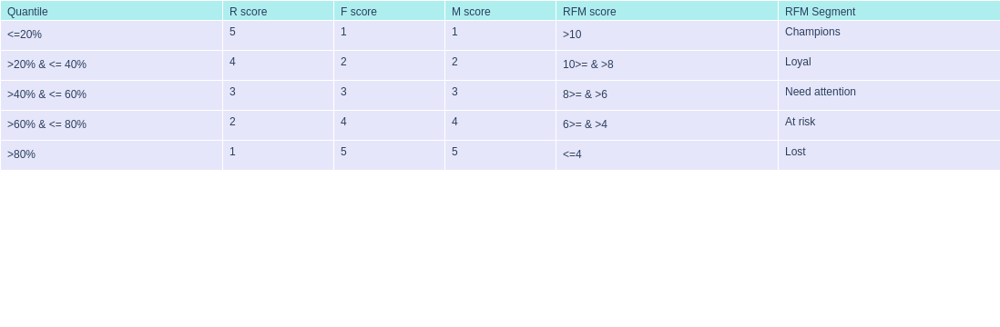

In [18]:
toplop=RFM_desc.columns
colplot=['Quantile',toplop[0],toplop[1],toplop[2],toplop[3],toplop[4]]
dss=22

import plotly.graph_objects as go
plt.rc('font', size=15)
fig = go.Figure(data=[go.Table(
    columnwidth = [20,10,10,10,20,20],
    header=dict(values=list(colplot),
                fill_color='paleturquoise',
                align='left',
                height=dss),
    cells=dict(values=[RFM_desc.index, RFM_desc[toplop[0]] ,RFM_desc[toplop[1]] 
                      ,RFM_desc[toplop[2]] ,RFM_desc[toplop[3]] 
                     ,RFM_desc[toplop[4]]],
               fill_color='lavender',
               align='left',
               height=dss))
])
fig.update_layout(height=180,margin=dict(t=0,b=0,l=0,r=0))
fig.show()

figure_name='RFM_desc.jpeg'
fig.write_image(figure_name)


!cp RFM_desc.jpeg /home/yonss/AndroidStudioProjects/Dashboard/Images
!mv RFM_desc.jpeg  /home/yonss/Bureau/Data_scientist/Data_scientist/FIGURES/P5/


## Analyse de la segmentation RFM

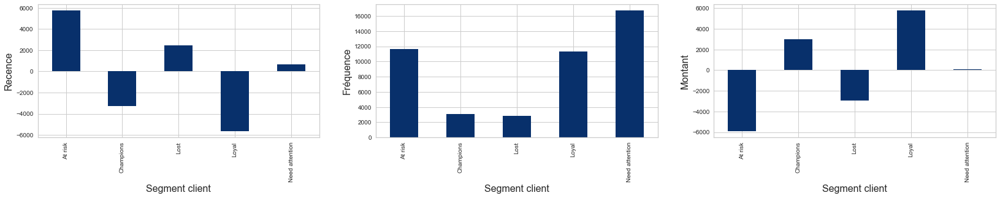

In [19]:
f, axes = plt.subplots(1, 3, figsize=(28, 4))
inx=0
groupe_by=['Segment']
plt.rc('font', size=20)
for knx in ['Recence','Fréquence','Montant']:
    df_merge_RFM.groupby(groupe_by).agg(knx).sum().plot(kind='bar',ax=axes[inx], colormap='Blues_r')
    axes[inx].set_ylabel(knx, fontsize=16)
    axes[inx].set_xlabel('Segment client', fontsize=16);
 
    inx=inx+1

In [20]:
dict_rfm_tiers = {'Champions': "Achetés récemment, achetés souvent et dépensant le plus", \
                  'Loyal': 'Fait des achats réguliers',\
                  'Need attention' : 'R, F et M supérieures à la moyenne. Il se peut que les achats ne soient pas très récents',\
                  'At risk': ' Achat fréquent mais il y a longtemps. Il faut les ramener ', \
                  'Lost': "Achat il y a longtemps et jamais revenu"}

df_merge_RFM['Description segment']= df_merge_RFM['Segment'].apply(lambda x: dict_rfm_tiers[x])

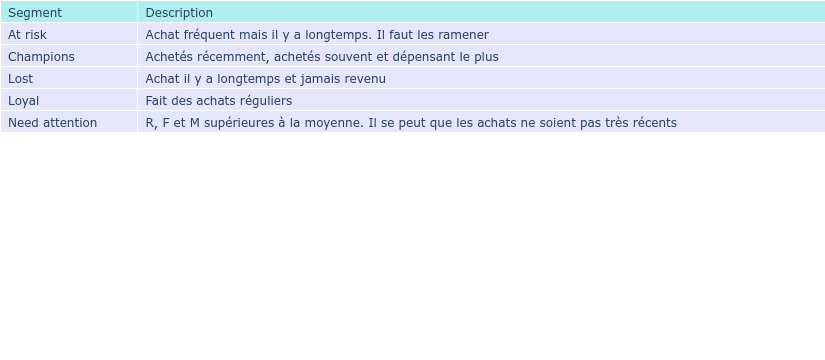

In [21]:

df_tbl_rfm = df_merge_RFM.groupby('Segment').agg(
    Description = ('Description segment', 'unique')
).round(1)

toplop=df_tbl_rfm.columns
colplot=['Segment',toplop[0]]
dss=22

import plotly.graph_objects as go
plt.rc('font', size=15)
fig = go.Figure(data=[go.Table(
    columnwidth = [80,400],
    header=dict(values=list(colplot),
                fill_color='paleturquoise',
                align='left',
                height=dss),
    cells=dict(values=[df_tbl_rfm.index,df_tbl_rfm[toplop[0]]   ],
               fill_color='lavender',
               align='left',
               height=dss))
])
fig.update_layout(height=150,margin=dict(t=0,b=0,l=0,r=0))
fig.show()
figure_name='Tab_desc.jpeg'
fig.write_image(figure_name)

!cp Tab_desc.jpeg /home/yonss/AndroidStudioProjects/Dashboard/Images
!mv Tab_desc.jpeg  /home/yonss/Bureau/Data_scientist/Data_scientist/FIGURES/P5/


In [22]:
dict_rfm_tiers = {'Champions': "Communication personnalisée, offre d'un programme de fidélité, pas besoin d'offres promotionnelles.", \
                  'Loyal': 'Proposer un programme de fidélité', 'Need attention': 'Recommander des produits et offrir des promotions.',\
                  'At risk': 'Essayez de les attirer avec des promotions limitées', \
                  'Lost': "Ne pas perdre de temps et d'argent pour les gagner."}

df_merge_RFM['marketing_approach']= df_merge_RFM['Segment'].apply(lambda x: dict_rfm_tiers[x])

df_tbl_rfm = df_merge_RFM.groupby('Segment').agg(
    Count = ('customer_id', 'count'),
    Recence = ('Recence', 'mean'),
    Frequence = ('Fréquence', 'mean'),
    Montant = ('Montant', 'mean'),
    Strategie = ('marketing_approach', 'unique'),
).round(1)

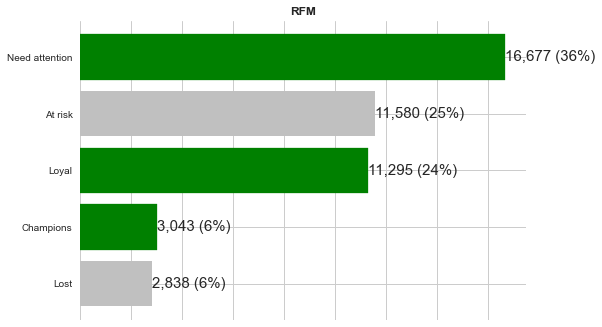

In [23]:
# compter le nombre de clients dans chaque segment
segments_counts = df_merge_RFM['Segment'].value_counts().sort_values(ascending=True)

figure_name='RFM_segment.jpeg'
#
fig, ax = plt.subplots()
plt.rc('font', size=15)
nombre_client_segment(segments_counts,fig,ax,'RFM',figure_name)

!cp RFM_segment.jpeg /home/yonss/AndroidStudioProjects/Dashboard/Images
!mv RFM_segment.jpeg   /home/yonss/Bureau/Data_scientist/Data_scientist/FIGURES/P5/

In [24]:
# Calculate average values for each RFM_Level, and return a size of each segment 
rfmTable_level_agg = df_merge_RFM.groupby('Segment').agg({
    'Recence': 'mean',
    'Fréquence': 'mean',
    'Montant': ['mean', 'count']
}).round(1)

In [25]:
rfmTable_level_agg.index

Index(['At risk', 'Champions', 'Lost', 'Loyal', 'Need attention'], dtype='object', name='Segment')

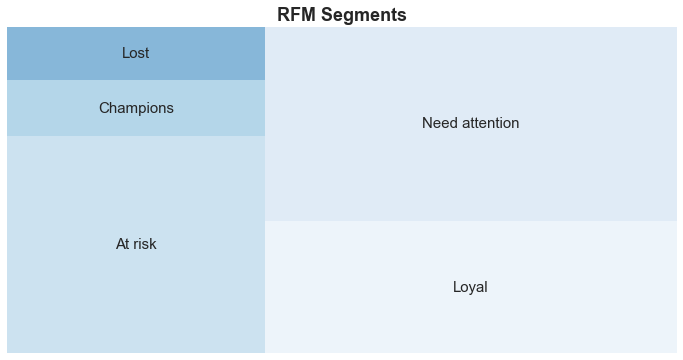

In [26]:
rfmTable_level_agg.columns = ['Recence mean','Fréquence mean','Montant mean', 'Count']
#
norm = matplotlib.colors.Normalize(vmin=min(df_merge_RFM['RFM_Score']), vmax=max(df_merge_RFM['RFM_Score']))

colors = [matplotlib.cm.Blues(norm(value)) for value in df_merge_RFM['RFM_Score']]

fig = plt.gcf()
ax = fig.add_subplot()
fig.set_size_inches(12,6)
plt.rc('font', size=15)
squarify.plot(sizes=rfmTable_level_agg['Count'], 
              label=rfmTable_level_agg.index, color = colors, alpha=.6)
plt.title("RFM Segments",fontsize=18,fontweight="bold")
 
plt.axis('off')
plt.show()

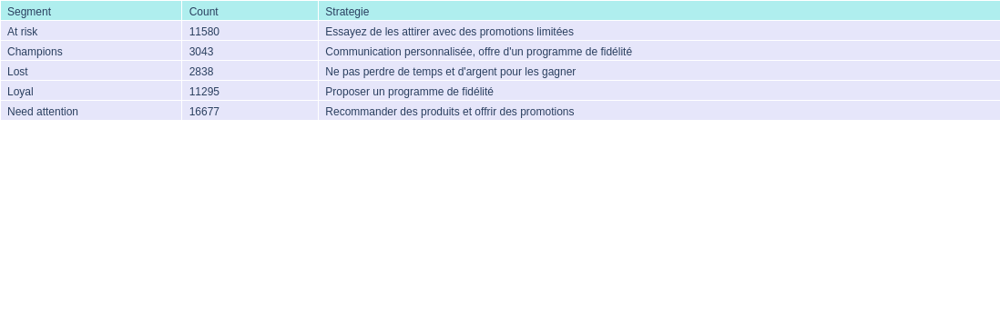

In [27]:
dict_rfm_tiers = {'Champions': "Communication personnalisée, offre d'un programme de fidélité", \
                  'Loyal': 'Proposer un programme de fidélité', \
                  'Need attention': 'Recommander des produits et offrir des promotions',\
                  'At risk': 'Essayez de les attirer avec des promotions limitées', \
                  'Lost': "Ne pas perdre de temps et d'argent pour les gagner"}

df_merge_RFM['marketing_approach']= df_merge_RFM['Segment'].apply(lambda x: dict_rfm_tiers[x])

df_tbl_rfm = df_merge_RFM.groupby('Segment').agg(
    Count = ('customer_id', 'count'),
    Recence = ('Recence', 'mean'),
    Frequence = ('Fréquence', 'mean'),
    Montant = ('Montant', 'mean'),
    Strategie = ('marketing_approach', 'unique'),
).round(1)

toplop=df_tbl_rfm.columns
colplot=['Segment',toplop[0],toplop[4]]
dss=22
import plotly.graph_objects as go
plt.rc('font', size=15)
fig = go.Figure(data=[go.Table(
    columnwidth = [80,60,300],
    header=dict(values=list(colplot),
                fill_color='paleturquoise',
                align='left',
                height=dss),
    cells=dict(values=[df_tbl_rfm.index,df_tbl_rfm[toplop[0]] ,
                       df_tbl_rfm[toplop[4]]  ],
               fill_color='lavender',
               align='left',
               height=dss))
])
fig.update_layout(height=150,margin=dict(t=0,b=0,l=0,r=0))
fig.show()

figure_name='Tab_strategie.jpeg'
fig.write_image(figure_name)

!cp Tab_strategie.jpeg /home/yonss/AndroidStudioProjects/Dashboard/Images
!mv Tab_strategie.jpeg  /home/yonss/Bureau/Data_scientist/Data_scientist/FIGURES/P5/

### Remarques

Le segment RFM le plus important est le groupe "Need atention". Ce clients doivent être ciblés par des offres et des remises afin d'assurer le succès de l'entreprise.
Le deuxieme groupe le plus important est le "at risk". Il faut faire des efforts pour cibler ces clients en les attirer avec des promotions limitées

Si l'on applique le célèbre principe de Pareto, selon lequel 80 % de vos ventes totales sont susceptibles de venir de vos 20 % d'utilisateurs les plus importants, 
la rétention des clients fidèles est très importante pour la réussite de l'entreprise.Il est donc extrêmement important d'avoir une bonne estimation des différents segments.

Pour évaluer/améliorer la segmentation des clients, nous utiliserons les techniques d'apprentissage automatique et les comparerons avec la méthode RFM. Nous implémenterons le clustoring KMeans sur les données de recence, fréquence et montant calculé précédemment.

## Repartition KMeans obtenue avec les données RFM

Afin de pouvoir comparer les résultats avec ceux de la segmentation RFM, les données ne seront pas mises à l'échelle.

In [28]:
rfm_table=copy.deepcopy(df_merge_RFM)

In [29]:
tokeep=['Recence', 'Fréquence', 'Montant']
rfm_data=rfm_table.drop(rfm_table.columns.difference(tokeep),axis=1)

In [30]:
data_norm= pd.DataFrame(rfm_data,index=rfm_data.index,columns=rfm_data.columns)


### Sélection du K optimal pour le regroupement K-means à l'aide du paquet yellowbrick 

In [31]:
nclusters=5 

### Repartition des données
#### Stabilité à l'initialisation du K-Means

In [32]:
RFM_stability = stability_measure(nclusters,data_norm)        

ARI  Iteration  0 - Iteration  0 =  1.0
ARI  Iteration  1 - Iteration  0 =  0.51
ARI  Iteration  2 - Iteration  1 =  0.99
ARI  Iteration  3 - Iteration  2 =  0.99
ARI  Iteration  4 - Iteration  3 =  0.51
ARI  Iteration  5 - Iteration  4 =  1.0
ARI  Iteration  6 - Iteration  5 =  1.0
ARI  Iteration  7 - Iteration  6 =  0.51
ARI  Iteration  8 - Iteration  7 =  0.51
ARI  Iteration  9 - Iteration  8 =  1.0


Le clustering avec les données RFM est stable. Les étiquettes qui correspondent parfaitement ont un score proche de 1

In [33]:
[data_norm,labels,centers,name] = final_KMeans_model(data_norm,nclusters,rstate)

[51.22763956 99.84740821]


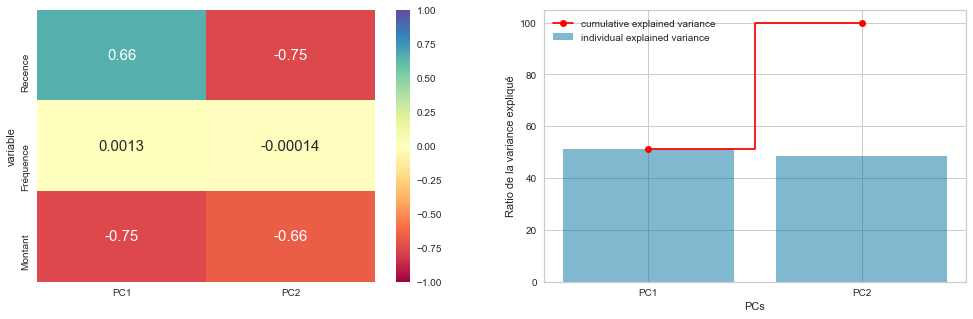

In [34]:
X_rfm0=data_norm.drop([name],axis=1)
figure_name =Path(str(dir_fig) +'/' + str('percentagen_explique.jpeg'))

[data_norm_dim_red,pca_data_norm] = \
                                        pca_dim_reduction(X_rfm0,var_explaned,figure_name) 

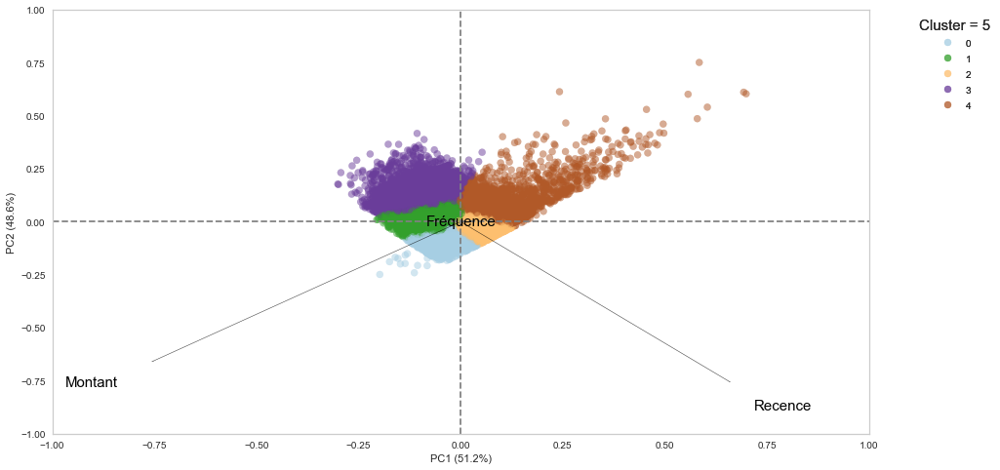

In [35]:
figure_name='PCA_KRFM.jpeg'
myplot(data_norm_dim_red,data_norm,name, pca_data_norm, \
       [0,1],boundary, alpha,figure_name,list(X_rfm0.columns))


!cp PCA_KRFM.jpeg /home/yonss/AndroidStudioProjects/Dashboard/Images
!mv PCA_KRFM.jpeg  /home/yonss/Bureau/Data_scientist/Data_scientist/FIGURES/P5/

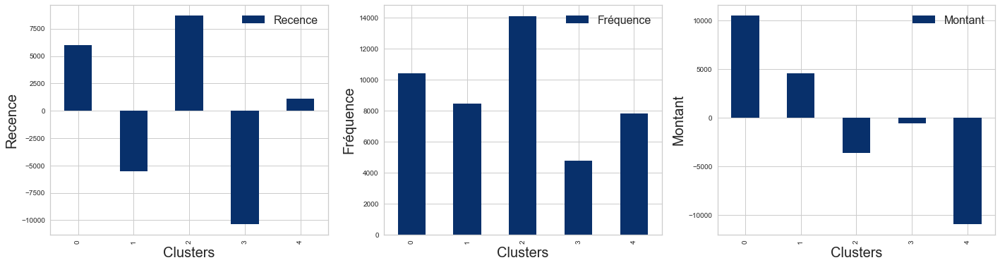

In [36]:
f, axes = plt.subplots(1, 3, figsize=(24, 6))
plt.rc('font', size=20)
inx0=0
kn=0
for knx_data in [data_norm]:
    groupe_by=[name]
    inx=0
    for knx in ['Recence','Fréquence','Montant']:
        knx_data.groupby(name).agg(knx).sum().plot(kind='bar',ax=axes[inx], colormap='Blues_r')
        axes[inx].set_ylabel(knx, fontsize=20)
        axes[inx].set_xlabel('Clusters', fontsize=20);
        axes[inx].legend(fontsize=16);
           
        inx=inx+1
        
        if inx==3:
            inx0=inx0+1
    kn=kn+1


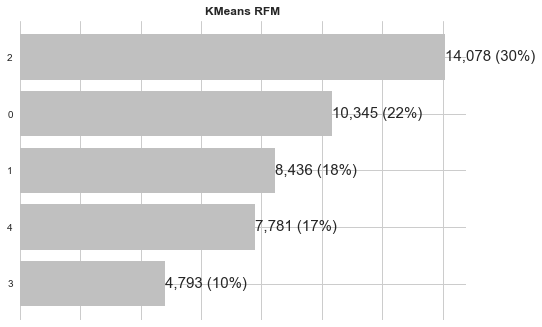

In [37]:
# compter le nombre de clients dans chaque segment
clustor_counts = data_norm[name].value_counts().sort_values(ascending=True)

figure_name='RFM_clustor.jpeg'
#
fig, ax = plt.subplots()
nombre_client_segment(clustor_counts,fig,ax,'KMeans RFM',figure_name)

!cp RFM_clustor.jpeg /home/yonss/AndroidStudioProjects/Dashboard/Images
!mv RFM_clustor.jpeg   /home/yonss/Bureau/Data_scientist/Data_scientist/FIGURES/P5/

In [38]:
data_norm_agg=copy.deepcopy(data_norm)
data_norm_agg= data_norm_agg.groupby(name).agg({'Recence': 'mean','Fréquence': 'mean','Montant': ['mean','count']
                                               }).round(1)

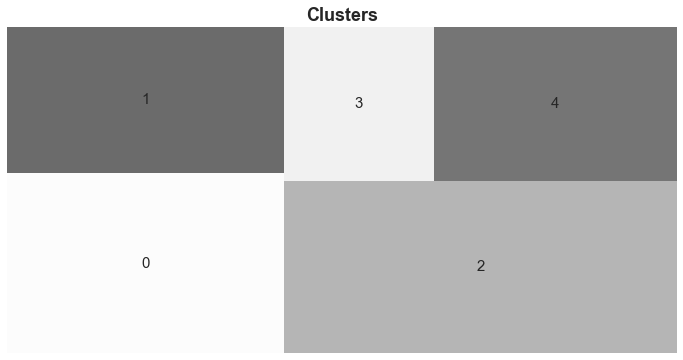

In [39]:
data_norm_agg.columns = ['Recence mean','Fréquence mean','Montant mean', 'Count']
#
fig = plt.gcf()
ax = fig.add_subplot()
fig.set_size_inches(12,6)
squarify.plot(sizes=data_norm_agg['Count'], label=data_norm_agg.index, alpha=.6)
plt.title("Clusters",fontsize=18,fontweight="bold")
plt.axis('off')
plt.show()

Le regroupement K-Means avec le jeu de donnees d'entrainmenet et de test font apparaître quatre segments de clientèle qui correspondent bien aux données, comme c'est le cas de la segmentation RFM.

## Comparaison de la segmentation RFM et le clustoring KMeans obtenue avec les données RFM

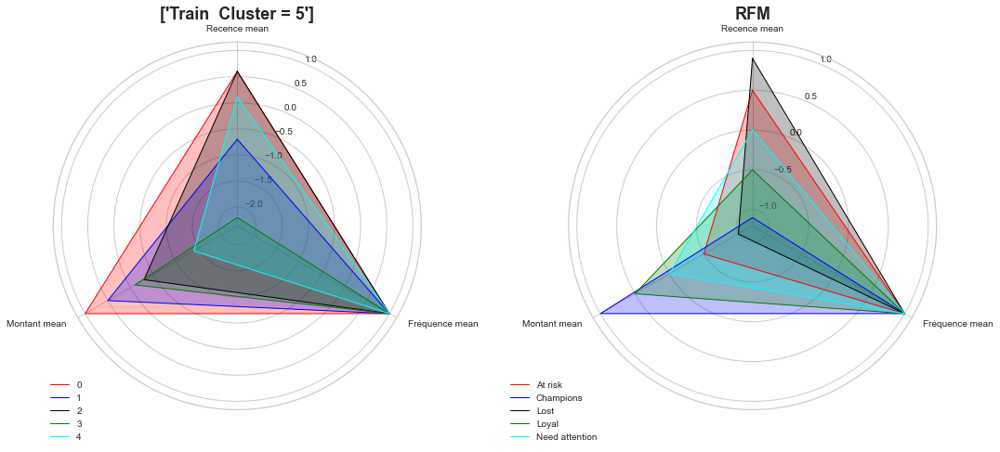

In [40]:
palette=['red','blue','black','green','cyan','magenta']
 
fig, ax = plt.subplots(1,2,figsize=(12,8), subplot_kw=dict(polar=True))
fig.subplots_adjust(left=0.1,bottom=0.1, right=1.2, top=0.9, wspace=0.4, hspace=0.5)
plt.rc('font', size=20)
#----------------- Pour les résultats du KMeans
data_norm_radar=copy.deepcopy(data_norm_agg)
index=data_norm_radar.index

data_norm_radar=data_norm_radar.drop(['Count'],axis=1)
plot_radar(data_norm_radar,fig,ax,index,0,[str('Train')+ '  ' + str(name) ],palette,1)

#----------------- Pour les résultats du RFM
rfmTable_level_radar=copy.deepcopy(rfmTable_level_agg)
index=rfmTable_level_radar.index
rfmTable_level_radar=rfmTable_level_radar.reset_index()
#
rfmTable_level_radar=rfmTable_level_radar.drop(['Count'],axis=1)
rfmTable_level_radar=rfmTable_level_radar.drop(['Segment'],axis=1)
plot_radar(rfmTable_level_radar,fig,ax,index,1,'RFM',palette,1)


plt.savefig('Radar_RFM_KMeans.jpeg',format='jpeg',dpi=100,bbox_inches='tight')

!cp Radar_RFM_KMeans.jpeg /home/yonss/AndroidStudioProjects/Dashboard/Images
!mv Radar_RFM_KMeans.jpeg   /home/yonss/Bureau/Data_scientist/Data_scientist/FIGURES/P5/

In [41]:
df_group_4 = data_norm.groupby(name)
ass=df_group_4.agg({
    'Recence': ['mean','sum'],
    'Fréquence':[ 'mean','sum'],
    'Montant': ['mean', 'count']
  }).round(1)

df_group_RFM = df_merge_RFM.groupby('Segment')
ass_rfm=df_group_RFM.agg({
    'Recence': ['mean','sum'],
    'Fréquence': ['mean','sum'],
    'Montant': ['mean', 'count']
  }).round(1)

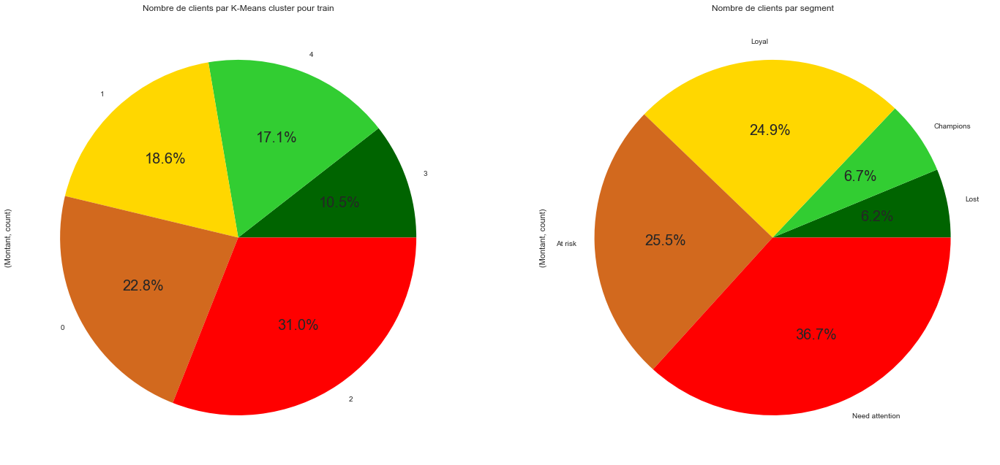

In [42]:
colors=['darkgreen','limegreen','gold','chocolate','red']
f, axes = plt.subplots(1,2, figsize=(24, 12))
plt.rc('font', size=20) 
# Tracer les clients par cluster K-Means
ass = ass.sort_values(by=('Montant','count'), ascending=True)
ass['Montant', 'count'].plot(kind='pie',ax=axes[0],autopct='%1.1f%%', legend=False, colors=colors)
axes[0].set_title('Nombre de clients par K-Means cluster pour train');

# Tracer les clients par cluster K-Means
ass_rfm = ass_rfm.sort_values(by=('Montant','count'), ascending=True)
ass_rfm['Montant', 'count'].plot(kind='pie',ax=axes[1],autopct='%1.1f%%', legend=False, colors=colors)
axes[1].set_title('Nombre de clients par segment');



plt.savefig('PIE_RFM_KMeans.jpeg',format='jpeg',dpi=100,bbox_inches='tight')

!cp PIE_RFM_KMeans.jpeg /home/yonss/AndroidStudioProjects/Dashboard/Images
!mv  PIE_RFM_KMeans.jpeg   /home/yonss/Bureau/Data_scientist/Data_scientist/FIGURES/P5/

### Mesure de similarité entre la segmentation RFM et la repartition KMeans 

In [43]:
var2drop=[name]
df_merge_rfm_best=copy.deepcopy(data_norm)
df_merge_rfm_best=df_merge_rfm_best.drop(var2drop,axis=1)

In [44]:
Segment_RFM=df_merge_RFM.drop(df_merge_RFM.columns.difference(['Segment_code']),\
                                axis=1)

In [45]:
# RFM_KMeans vs DN_KMeans
# Silhouette Score
ss1=[metrics.silhouette_score(df_merge_rfm_best,Segment_RFM['Segment_code']), \
     metrics.silhouette_score(df_merge_rfm_best,data_norm[name])]
#
# Davies Bouldin Score
db1=[metrics.davies_bouldin_score(df_merge_rfm_best,Segment_RFM['Segment_code']),\
     metrics.davies_bouldin_score(df_merge_rfm_best,data_norm[name])]


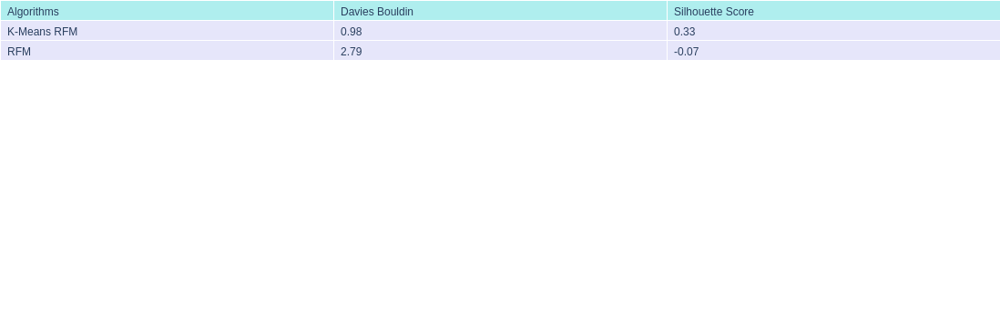

In [46]:
algorithms1=["RFM","K-Means RFM"]

comprsn_RFM={"Algorithms":algorithms1,"Davies Bouldin":db1,"Silhouette Score":ss1}
compdf_RFM=pd.DataFrame(comprsn_RFM).round(2)
compdf_RFM=compdf_RFM.sort_values(by=["Silhouette Score"], ascending=False)


toplop=compdf_RFM.columns
colplot=[toplop[0],toplop[1],toplop[2]]
dss=22
fig = go.Figure(data=[go.Table(
    columnwidth = [30,30,30],
    header=dict(values=list(colplot),
                fill_color='paleturquoise',
                align='left',
                height=dss),
    cells=dict(values=[compdf_RFM[toplop[0]] ,compdf_RFM[toplop[1]] ,
                       compdf_RFM[toplop[2]]  ],
               fill_color='lavender',
               align='left',
               height=dss))
])

fig.update_layout(height=70,margin=dict(t=0,b=0,l=0,r=0))
fig.show()

figure_name='score_RFM.jpeg'
fig.write_image(figure_name)

!cp score_RFM.jpeg /home/yonss/AndroidStudioProjects/Dashboard/Images
!mv score_RFM.jpeg  /home/yonss/Bureau/Data_scientist/Data_scientist/FIGURES/P5/

### Remarques
Les repartitions obtenue par le clustoring KMeans présente des traits communs à celle obtenue par la metode RFM. Seul le pourcentage diffère.  

- Cluster 1: Loyal
- Cluster 0: At risk
- Cluster 3: Lost
- Cluster 4: Champions
- Cluster 2: Need attention

Le score silhouette est plus élevé dans le K-Means, ce qui suggère aue cette methode capture au mieux la segmentation de cet ensemble de données. Dans RFM, le score silhouette negatif indique clairement que la classification est faible.

Ces resultats metent en evidance les limitations de la segmentation RFM. Pour avoir plus de certitude dans la classification obtenue, nous allons effectuer deux repartition: une avec les donnees brutes (i.e. les donnees observées sans la RFM) et l'autre avec la RFM additionee aux donnees brutes. 

 ## Repartition KMeans obtenue avec les données brutes addicionée à RFM (RFM+DN)

In [113]:
start = time.process_time()
var2drop=['R_Quintile','F_Quintile','M_Quintile','RFM_Score','order_approved_at',\
          'Segment_code', 'Segment','customer_id', 'payment_type','product_category_name',\
          'customer_unique_id','marketing_approach','Description segment',\
          'customer_city', 'customer_state','review_answer_timestamp','order_purchase_timestamp',\
          'geolocation_lat', 'geolocation_lng']
df_merge_RFM_DN=copy.deepcopy(df_merge_RFM)

df_merge_RFM_DN=df_merge_RFM_DN.drop(var2drop,axis=1)

In [114]:
df_merge_RFM_DN.head()

,payment_value,review_score,DaysSinceOrder,DeliveryWaitingPeriod,review_creation_date,TimeSinceRevueCreation,Recence,Fréquence,Montant
0,1.24,0.63,0.83,2.82,-0.83,-0.82,0.83,1,1.24
1,0.51,-0.90,-0.12,0.02,0.56,0.49,-0.12,1,0.51
2,0.96,-0.90,-0.86,-1.12,1.02,0.37,-0.86,1,0.96
3,-0.34,-2.42,1.18,-0.14,-1.97,0.33,1.18,1,-0.34
4,0.51,0.63,0.79,0.48,-0.82,-0.40,0.79,1,0.51


### Trouver le K optimal

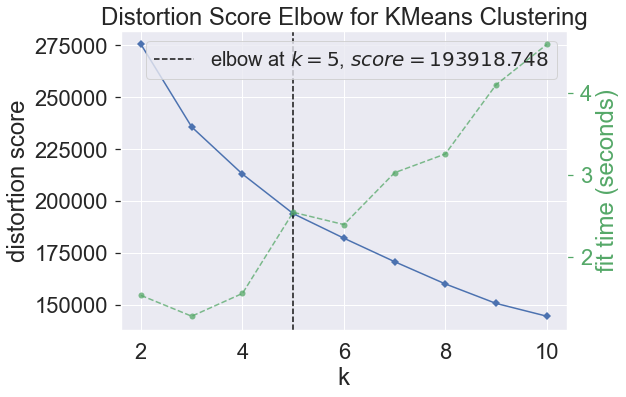

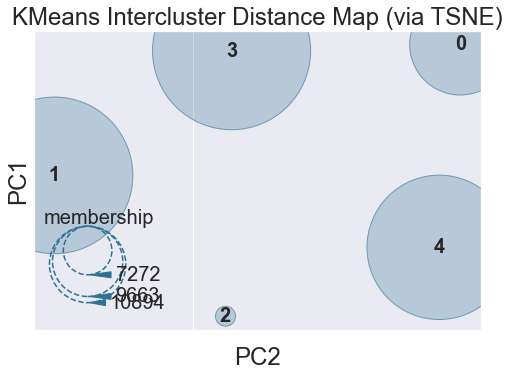

Le nombre optimal de clusters est 5


In [115]:
nclusters=find_optimal_K(rstate,df_merge_RFM_DN)
print("Le nombre optimal de clusters est",nclusters)

### Stabilité à l'initialisation du K-Means

In [116]:
RFM_stability = stability_measure(nclusters,df_merge_RFM_DN)        

ARI  Iteration  0 - Iteration  0 =  1.0
ARI  Iteration  1 - Iteration  0 =  0.99
ARI  Iteration  2 - Iteration  1 =  0.99
ARI  Iteration  3 - Iteration  2 =  0.98
ARI  Iteration  4 - Iteration  3 =  0.96
ARI  Iteration  5 - Iteration  4 =  0.96
ARI  Iteration  6 - Iteration  5 =  0.99
ARI  Iteration  7 - Iteration  6 =  0.97
ARI  Iteration  8 - Iteration  7 =  1.0
ARI  Iteration  9 - Iteration  8 =  1.0


In [117]:
[df_merge_RFM_DN,labels,centers,name1] = final_KMeans_model(df_merge_RFM_DN,nclusters,rstate)

end = time.process_time()

print(end - start)

373.9462350829999


### Visualisation à l'aide de l'ACP

[36.13170661 61.34299777 75.23995261]


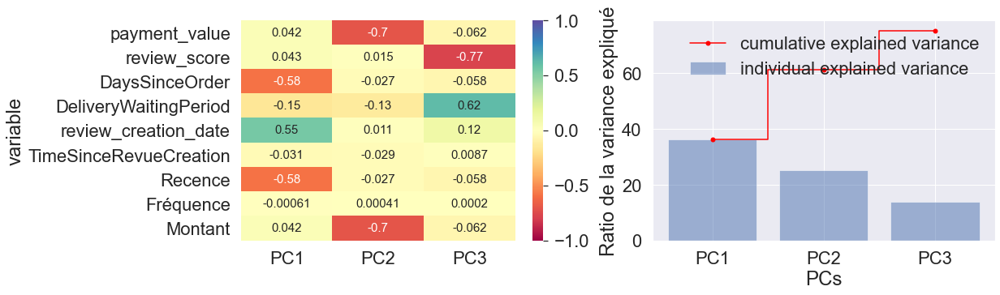

In [118]:
X_RFM_DN=df_merge_RFM_DN.drop(name1,axis=1)
Y_RFM_DN=df_merge_RFM_DN[name1].to_numpy()
X_RFM_DN=df_merge_RFM_DN.drop(name1,axis=1)
Y_RFM_DN=df_merge_RFM_DN[name1].to_numpy()

#
figure_name =Path(str(dir_fig) +'/' + str('percentagen_explique.jpeg'))
 
[df_merge_RFM_DN_DR,pca_data_norm_RFM_DN] = \
                                        pca_dim_reduction(X_RFM_DN,var_explaned,figure_name) 

 - From above we plot we can clealry observer that 4 dimension() are able to explain ~83% of the data variance.
- so we will use first 4 principal components going forward and analyse the data.

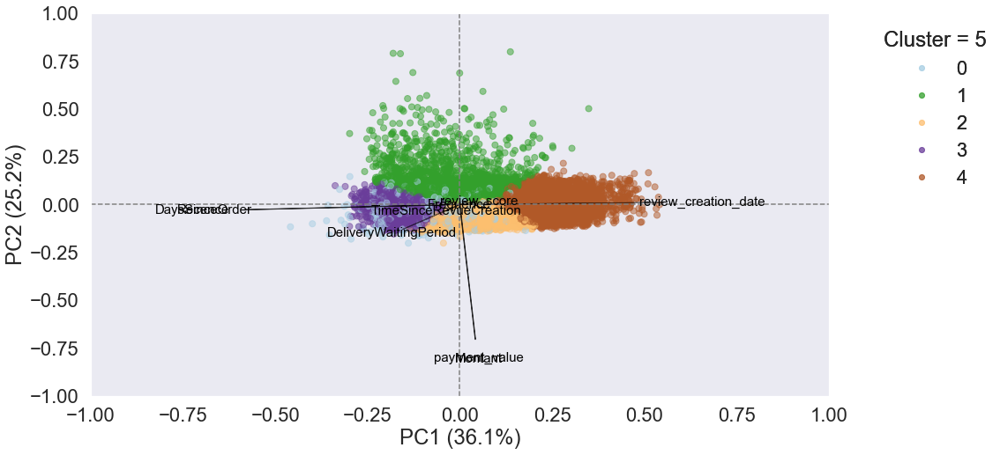

In [119]:
myplot(df_merge_RFM_DN_DR,df_merge_RFM_DN,name1, pca_data_norm_RFM_DN, \
       [0,1],boundary, alpha,'ACP_01.jpeg',list(X_RFM_DN.columns))



Nous pouvons voir que les variables payment_value et Delivery_WaitingPeriod sont fortement associées et forment un cluster.

## Repartition KMeans obtenue avec les données brutes seulement (DN)

In [120]:
df_merge_DN=copy.deepcopy(df_merge_RFM_DN)
#
var2drop=['Fréquence','Montant','Recence',name1]
#
df_merge_DN=df_merge_DN.drop(var2drop,axis=1)
feat_cols=df_merge_DN.columns
print(feat_cols)

Index(['payment_value', 'review_score', 'DaysSinceOrder',
       'DeliveryWaitingPeriod', 'review_creation_date',
       'TimeSinceRevueCreation'],
      dtype='object')


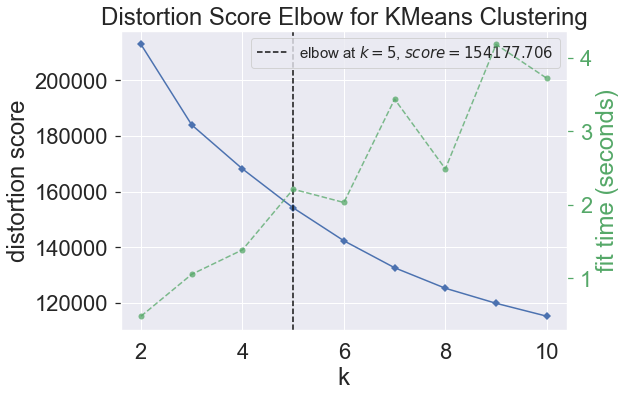

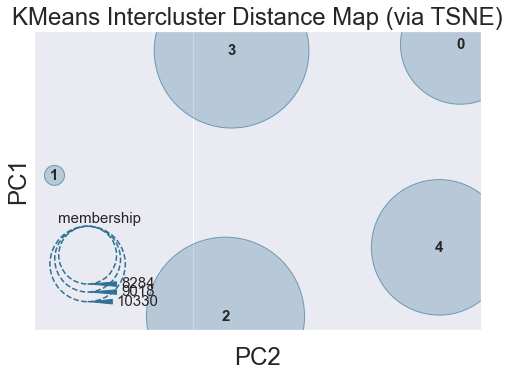

Le nombre optimal de clusters est 5
Same clusters as the model with  DN data 5 5


In [121]:
nclusters_DN=find_optimal_K(rstate,df_merge_DN)
print("Le nombre optimal de clusters est",nclusters)

if nclusters_DN == nclusters:
    print("Same clusters as the model with  DN data",nclusters_DN, nclusters)
else:
    print("Different clusters compared with the model with DN data",nclusters_DN, nclusters)


### Stabilité à l'initialisation du K-Means

In [122]:
RFM_stability = stability_measure(nclusters_DN,df_merge_DN) 

ARI  Iteration  0 - Iteration  0 =  1.0
ARI  Iteration  1 - Iteration  0 =  0.99
ARI  Iteration  2 - Iteration  1 =  1.0
ARI  Iteration  3 - Iteration  2 =  0.99
ARI  Iteration  4 - Iteration  3 =  0.99
ARI  Iteration  5 - Iteration  4 =  0.99
ARI  Iteration  6 - Iteration  5 =  0.66
ARI  Iteration  7 - Iteration  6 =  0.67
ARI  Iteration  8 - Iteration  7 =  0.98
ARI  Iteration  9 - Iteration  8 =  0.98


In [123]:
[df_merge_DN,labels,centers,name2] = final_KMeans_model(df_merge_DN,nclusters_DN,rstate)

X_DN=df_merge_DN.drop(name2,axis=1)
Y_DN=df_merge_DN[name2].to_numpy()

X_DN_test=df_merge_DN.drop(name2,axis=1)
Y_DN_test=df_merge_DN[name2].to_numpy()

ARI_KMeans_KMeans_DN=adjusted_rand_score(Y_RFM_DN,Y_DN)
print('TRAIN  =', ARI_KMeans_KMeans_DN)
#

TRAIN  = 0.43335742014201495


[32.31655849 51.31741718 68.19426527 84.61144865]


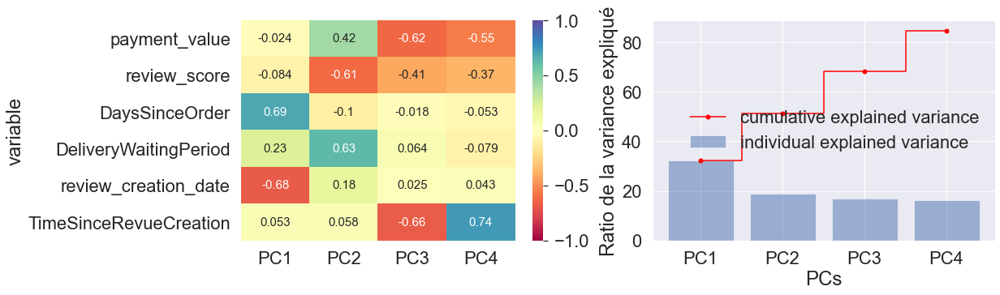

In [124]:
figure_name =Path(str(dir_fig) +'/' + str('percentagen_explique.jpeg'))

[df_merge_DN_DR,pca_DN_DR] = pca_dim_reduction(X_DN,var_explaned,figure_name) 

The explained variance is sligtly lower than the clustoring with RFM+DN

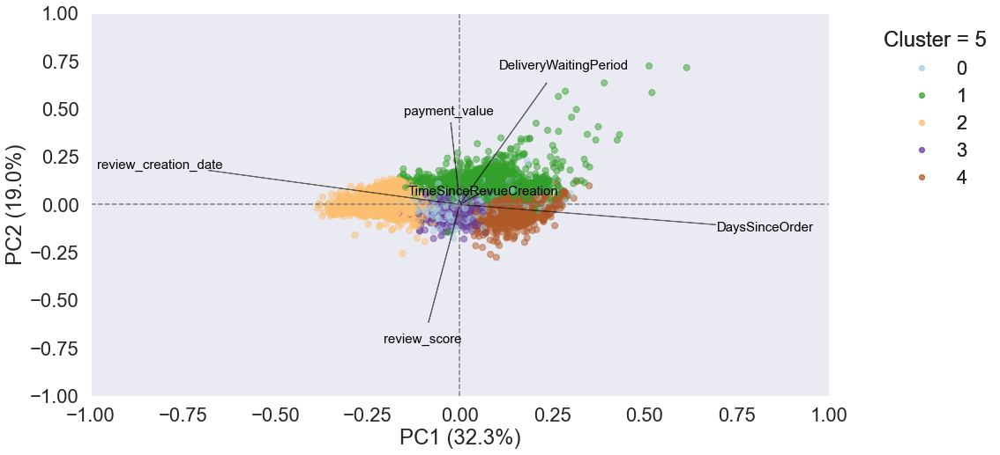

In [125]:
myplot(df_merge_DN_DR,df_merge_DN,name2, pca_DN_DR, \
       [0,1],boundary, alpha,'ACP_01_DN_RFM.jpeg',list(X_DN.columns))


### Mesure de similarité entre la repartition KMeans  avec DN seule et DN+RFM

In [126]:
data_norm_RFM_DN= pd.DataFrame(df_merge_RFM_DN)

data_norm_agg_RFM_DN=copy.deepcopy(data_norm_RFM_DN)
data_norm_agg_RFM_DN=data_norm_agg_RFM_DN.groupby(name).agg({'Recence': 'mean','Fréquence': 'mean','Montant': 'mean'
                                               }).round(1)
#____________________DN

data_norm_DN= pd.DataFrame(df_merge_DN)
data_norm_DN['Recence']=df_merge_RFM['Recence']
data_norm_DN['Fréquence']=df_merge_RFM['Fréquence']
data_norm_DN['Montant']=df_merge_RFM['Montant']
data_norm_agg_DN=copy.deepcopy(data_norm_DN)
data_norm_agg_DN = data_norm_agg_DN.groupby(name).agg({'Recence': 'mean','Fréquence': 'mean','Montant': 'mean'
                                               }).round(1)
  

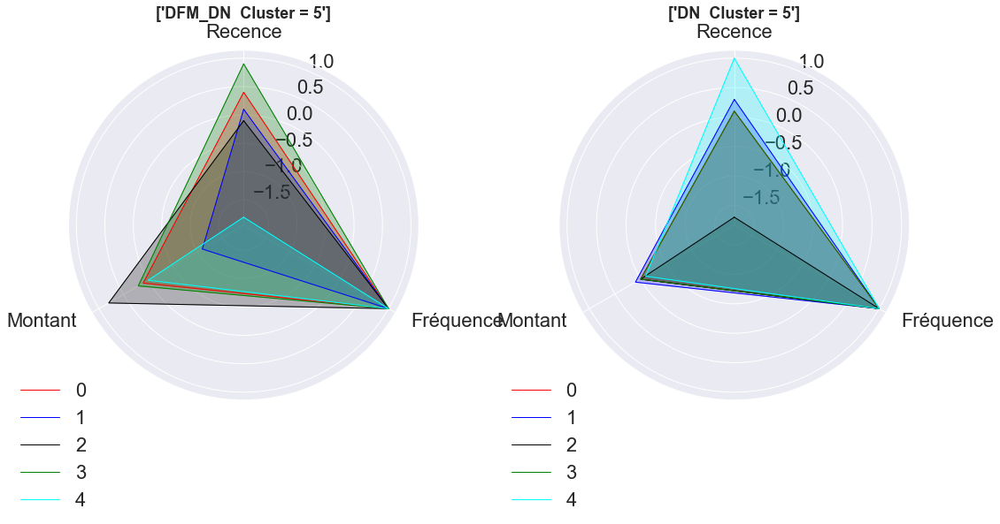

In [127]:
fig, ax = plt.subplots(1,2,figsize=(12,8), subplot_kw=dict(polar=True))
fig.subplots_adjust(left=0.1,bottom=0.1, right=1.2, top=0.9, wspace=0.4, hspace=0.5)

#----------------- Pour les résultats du KMeans
data_norm_radar=copy.deepcopy(data_norm_agg_RFM_DN)
index=data_norm_radar.index

plot_radar(data_norm_radar,fig,ax,index,0,[str('DFM_DN')+ '  ' + str(name) ],palette,1)

data_norm_radar_test=copy.deepcopy(data_norm_agg_DN)
index_test=data_norm_radar_test.index

plot_radar(data_norm_radar_test,fig,ax,index,1,[str('DN')+'  ' + str(name) ],palette,1)
plt.rc('font', size=20) 
plt.savefig('Radar_DN_RFM_KMeans.jpeg',format='jpeg',dpi=100,bbox_inches='tight')

!cp Radar_DN_RFM_KMeans.jpeg /home/yonss/AndroidStudioProjects/Dashboard/Images
!mv Radar_DN_RFM_KMeans.jpeg   /home/yonss/Bureau/Data_scientist/Data_scientist/FIGURES/P5/


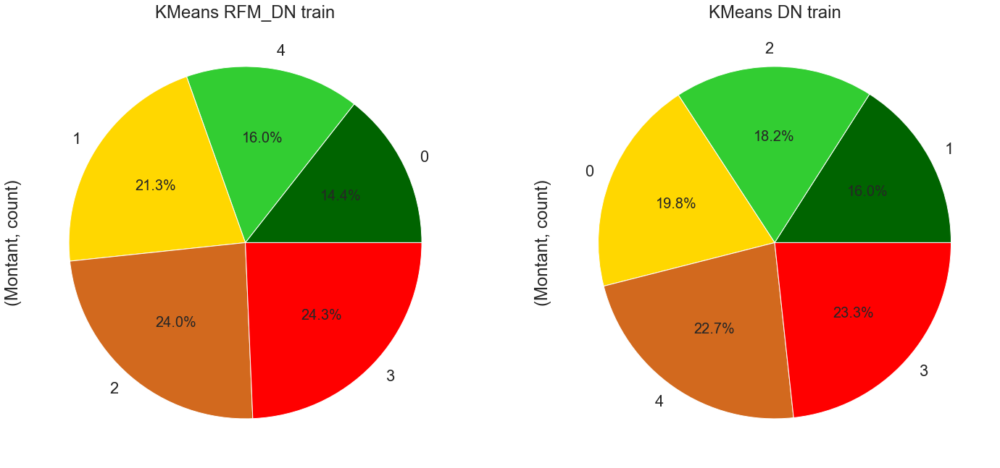

In [128]:
data_norm_RFM_DN= pd.DataFrame(df_merge_RFM_DN)
data_norm_RFM_DN = data_norm_RFM_DN.groupby(name)
RFM_DN =data_norm_RFM_DN.agg({
    'Montant': ['mean', 'count']
  }).round(1)

data_norm_DN = df_merge_DN.groupby(name)
DN=data_norm_DN.agg({
    'Montant': ['mean', 'count']
  }).round(1)

f, axes = plt.subplots(1,2, figsize=(24, 12))
# Tracer les clients par cluster K-Means
RFM_DN = RFM_DN.sort_values(by=('Montant','count'), ascending=True)
RFM_DN ['Montant','count'].plot(kind='pie',ax=axes[0],autopct='%1.1f%%', legend=False, colors=colors)
axes[0].set_title('KMeans RFM_DN train');


DN = DN.sort_values(by=('Montant','count'), ascending=True)
DN['Montant','count'].plot(kind='pie',ax=axes[1],autopct='%1.1f%%', legend=False, colors=colors)
axes[1].set_title('KMeans DN train');
plt.rc('font', size=20)  


plt.savefig('PIE_DN_RFM_KMeans.jpeg',format='jpeg',dpi=100,bbox_inches='tight')

!cp PIE_DN_RFM_KMeans.jpeg /home/yonss/AndroidStudioProjects/Dashboard/Images
!mv  PIE_DN_RFM_KMeans.jpeg   /home/yonss/Bureau/Data_scientist/Data_scientist/FIGURES/P5/

  

In [129]:
var2drop=[name1]
df_merge_RFM_DN_best=copy.deepcopy(df_merge_RFM_DN)
df_merge_RFM_DN_best=df_merge_RFM_DN_best.drop(var2drop,axis=1)

var2drop=[name2]
df_merge_DN_best=copy.deepcopy(df_merge_DN)
df_merge_DN_best=df_merge_DN_best.drop(var2drop,axis=1)

In [130]:
# RFM_KMeans vs DN_KMeans
# Silhouette Score
ss1=[metrics.silhouette_score(df_merge_RFM_DN_best,df_merge_RFM_DN[name1]),\
     metrics.silhouette_score(df_merge_DN_best,df_merge_DN[name2])]
#
# Davies Bouldin Score
db1=[metrics.davies_bouldin_score(df_merge_RFM_DN_best,df_merge_RFM_DN[name1]),\
     metrics.davies_bouldin_score(df_merge_DN_best,df_merge_DN[name2])]

algorithms1=["K-Means RFM + DN","K-Means DN"]

comprsn_DN={"Algorithms":algorithms1,"Davies Bouldin":db1,"Silhouette Score":ss1}
compdf_DN=pd.DataFrame(comprsn_DN).round(2)
compdf_DN=compdf_DN.sort_values(by=["Silhouette Score"], ascending=False)

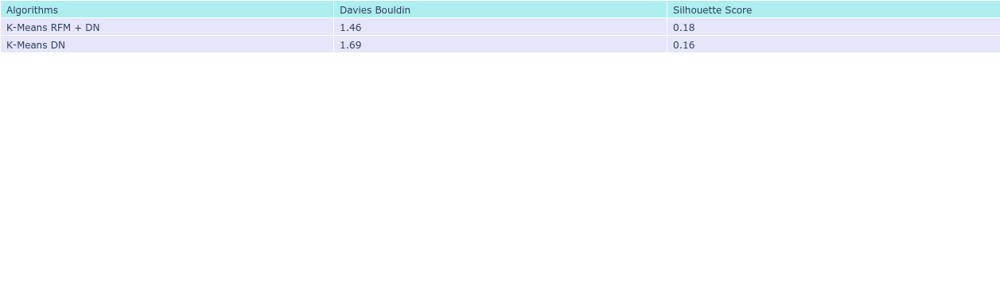

In [131]:
toplop=compdf_DN.columns
colplot=[toplop[0],toplop[1],toplop[2]]
dss=22

fig = go.Figure(data=[go.Table(
    columnwidth = [30,30,30],
    header=dict(values=list(colplot),
                fill_color='paleturquoise',
                align='left',
                height=dss),
    cells=dict(values=[compdf_DN[toplop[0]] ,compdf_DN[toplop[1]] ,
                       compdf_DN[toplop[2]]  ],
               fill_color='lavender',
               align='left',
               height=dss))
])

fig.update_layout(height=70,margin=dict(t=0,b=0,l=0,r=0))
fig.show()
plt.rc('font', size=10) 
figure_name='score_DN_RFM.jpeg'
fig.write_image(figure_name)

!cp score_DN_RFM.jpeg /home/yonss/AndroidStudioProjects/Dashboard/Images
!mv score_DN_RFM.jpeg  /home/yonss/Bureau/Data_scientist/Data_scientist/FIGURES/P5/

Les repartitions obtenue par le clustoring avec / sans les donnees RFM sont identiques. Seul le pourcentage diffère ligerement. 

Pour conclure, la repartition avec les donnees brutes addicionée à RFM (RFM+DN) presente le meilleur score Davies Bouldin et score Silhouette. Pour cette raison, on utilisera par la suite.

 ## Repartition KMeans obtenu avec les données RFM+DN et réduction de la dimension avec ACP

In [132]:
var2drop=[name1]

df_merge_RFM_DN_RD=copy.deepcopy(df_merge_RFM_DN)
df_merge_RFM_DN_RD=copy.deepcopy(df_merge_RFM_DN)

df_merge_RFM_DN_RD=df_merge_RFM_DN_RD.drop(var2drop,axis=1)

X_col=df_merge_RFM_DN_RD.columns

In [133]:
df_merge_RFM_DN_RD.head()

,payment_value,review_score,DaysSinceOrder,DeliveryWaitingPeriod,review_creation_date,TimeSinceRevueCreation,Recence,Fréquence,Montant
0,1.24,0.63,0.83,2.82,-0.83,-0.82,0.83,1,1.24
1,0.51,-0.90,-0.12,0.02,0.56,0.49,-0.12,1,0.51
2,0.96,-0.90,-0.86,-1.12,1.02,0.37,-0.86,1,0.96
3,-0.34,-2.42,1.18,-0.14,-1.97,0.33,1.18,1,-0.34
4,0.51,0.63,0.79,0.48,-0.82,-0.40,0.79,1,0.51


[36.13170661 61.34299777 75.23995261]


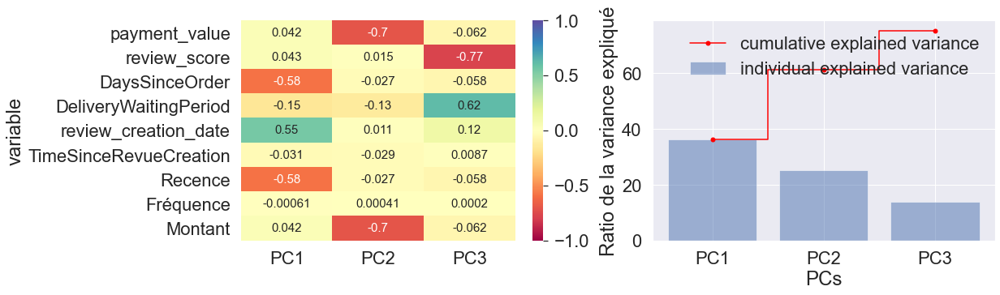

In [134]:
figure_name =Path(str(dir_fig) +'/' + str('percentagen_explique.jpeg'))

[df_merge_RFM_DN_RD,pca_RFM_DN_RD] = pca_dim_reduction(df_merge_RFM_DN_RD,var_explaned,figure_name) 

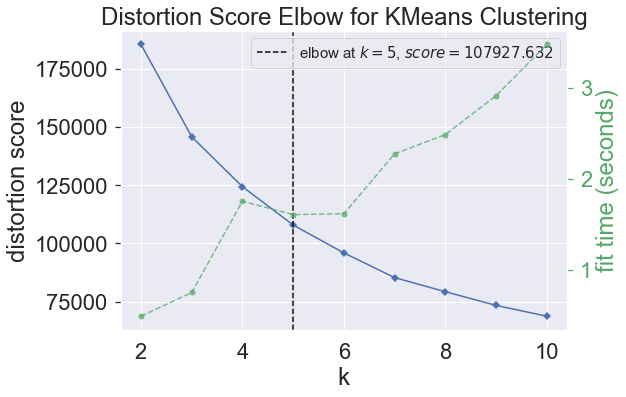

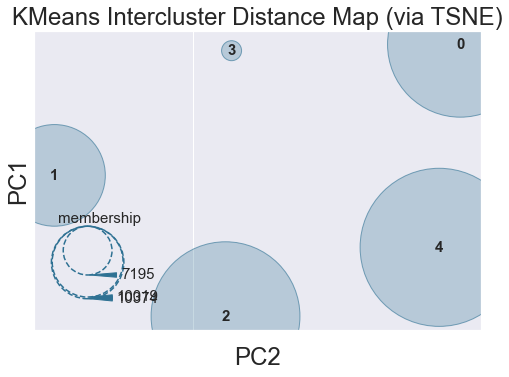

In [135]:
nclusters_RFM_DN_RD=find_optimal_K(rstate,df_merge_RFM_DN_RD)


### Stabilité à l'initialisation du K-Means

In [136]:
RFM_stability = stability_measure(nclusters_RFM_DN_RD,df_merge_RFM_DN_RD)

ARI  Iteration  0 - Iteration  0 =  1.0
ARI  Iteration  1 - Iteration  0 =  0.97
ARI  Iteration  2 - Iteration  1 =  1.0
ARI  Iteration  3 - Iteration  2 =  0.94
ARI  Iteration  4 - Iteration  3 =  0.98
ARI  Iteration  5 - Iteration  4 =  0.93
ARI  Iteration  6 - Iteration  5 =  0.98
ARI  Iteration  7 - Iteration  6 =  0.98
ARI  Iteration  8 - Iteration  7 =  0.99
ARI  Iteration  9 - Iteration  8 =  0.94


Less stable than the clustoring  with no reduced dimension

In [137]:
[df_merge_RFM_DN_RD,labels,centers,name3] = final_KMeans_model(df_merge_RFM_DN_RD,nclusters_RFM_DN_RD,rstate)

X_RFM_DN_RD=df_merge_RFM_DN_RD.drop(name3,axis=1)
Y_RFM_DN_RD=df_merge_RFM_DN_RD[name3].to_numpy()


ARI_KMeans_KMeans_RFM_DN_RD=adjusted_rand_score(Y_RFM_DN,Y_RFM_DN_RD)
print('TRAIN  =', ARI_KMeans_KMeans_RFM_DN_RD)
#

TRAIN  = 0.6759779598771322


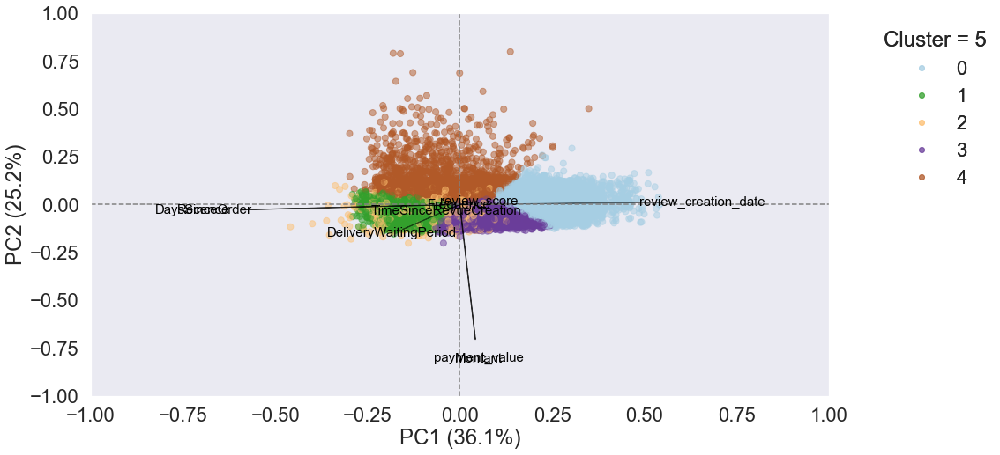

In [138]:
myplot(df_merge_RFM_DN_RD,df_merge_RFM_DN_RD,name3, pca_RFM_DN_RD, \
       [0,1],boundary, alpha,'PCA_plot.jpeg',list(X_col))

## Evaluation de la fréquence de la mise à jour de la segmentation 

D'abord on divise les donnees en 3 partie:\
<b>- Premier entrainement   -</b> 1 an   - 2016-10-03 à 2017-09-28\
<b>- Jeu de validation      -</b> 1 mois - 2018-07-26 à 2018-08-29\
<b>- Deuxieme entrainement  -</b> 1 an   - 2017-09-27 à 2018-07-25

Le deuximene entrainement est divisé en intervales de 3 mois et on avance backwards

Ensuite, on:
- Fait le premier entrainement
- Prédict sur le jeu de validation 
- Fait la boucle backward sur le deuxieme entrainement 
- Entraine un nouveau modèle
- Prédict sur le jeu de validation

In [139]:
var2drop=[name1]
#
df_merge_small=copy.deepcopy(df_merge_RFM_DN)
df_merge_small['order_approved_at']=df_merge_RFM['order_approved_at']
df_merge_small=df_merge_small.drop(var2drop,axis=1)
period_in_month = int((df_merge_small['order_approved_at'].max() - df_merge_small['order_approved_at'].min())/np.timedelta64(1,'M'))
print("La période complète des commandes porte sur {} mois.".format(period_in_month))

La période complète des commandes porte sur 22 mois.


In [141]:
#
# Past times
#
order_time=['order_approved_at']
period_step= 180*2  
var2drop=['order_approved_at']

date_debut = pd.to_datetime('2016-10-03')
date_fin = date_debut + pd.Timedelta(days=period_step)

filter_date         = (df_merge_small.order_approved_at>=date_debut) &  (df_merge_small.order_approved_at<date_fin) 
Train_Data_small_A= df_merge_small[filter_date].copy()         
Train_Data_small_A= Train_Data_small_A.drop(var2drop,axis=1)

kmeans_visualizer_A = KMeans(n_clusters=nclusters,random_state=rstate)
kmeans_visualizer_A.fit(Train_Data_small_A)
name_PA='Cluster = '+str(nclusters)

A_stability = stability_measure(nclusters,Train_Data_small_A) 
print(date_debut,date_fin)


ARI  Iteration  0 - Iteration  0 =  1.0
ARI  Iteration  1 - Iteration  0 =  0.54
ARI  Iteration  2 - Iteration  1 =  0.97
ARI  Iteration  3 - Iteration  2 =  1.0
ARI  Iteration  4 - Iteration  3 =  0.97
ARI  Iteration  5 - Iteration  4 =  0.54
ARI  Iteration  6 - Iteration  5 =  0.54
ARI  Iteration  7 - Iteration  6 =  0.97
ARI  Iteration  8 - Iteration  7 =  0.54
ARI  Iteration  9 - Iteration  8 =  0.54
2016-10-03 00:00:00 2017-09-28 00:00:00


In [142]:
#
# Future times
#
date_debut_future = pd.to_datetime('2018-07-26')
date_fin_future   = pd.to_datetime('2018-08-29')

filter_date         = (df_merge_small.order_approved_at>=date_debut_future) &  (df_merge_small.order_approved_at<date_fin_future) 
Train_Data_small_PA= df_merge_small[filter_date].copy()  
Train_Data_small_PA= Train_Data_small_PA.drop(var2drop,axis=1)

Train_Data_small_PA_raw =copy.deepcopy(Train_Data_small_PA)
Train_Data_small_PA[name_PA]=kmeans_visualizer_A.predict(Train_Data_small_PA)

ari_PA=Train_Data_small_PA[name_PA]

PA_stability = stability_measure(nclusters,Train_Data_small_PA)

ARI  Iteration  0 - Iteration  0 =  1.0
ARI  Iteration  1 - Iteration  0 =  0.85
ARI  Iteration  2 - Iteration  1 =  0.84
ARI  Iteration  3 - Iteration  2 =  1.0
ARI  Iteration  4 - Iteration  3 =  1.0
ARI  Iteration  5 - Iteration  4 =  0.84
ARI  Iteration  6 - Iteration  5 =  0.84
ARI  Iteration  7 - Iteration  6 =  0.88
ARI  Iteration  8 - Iteration  7 =  0.84
ARI  Iteration  9 - Iteration  8 =  0.84


In [143]:
#
# Present times
#
ARI = []

date_debut = pd.to_datetime('2018-07-26')
date_fin = date_debut - pd.Timedelta(days=period_step)
dfs=30
for i in range(1,50):
    date_new     = date_debut - pd.Timedelta(days=dfs*i)
    date_new_fin = date_new - pd.Timedelta(days=dfs*3)
    
    if date_new_fin >= pd.to_datetime('2017-09-28') : 
        filter_date     = (df_merge_small.order_approved_at<=date_new) &  (df_merge_small.order_approved_at>date_new_fin) 
        Train_Data_small_B= df_merge_small[filter_date].copy()    
        Train_Data_small_B= Train_Data_small_B.drop(var2drop,axis=1)
        
        kmeans_visualizer_B = KMeans(n_clusters=nclusters,random_state=rstate)
        kmeans_visualizer_B.fit(Train_Data_small_B)
        name_B='Cluster predict = '+str(nclusters)
        
        Train_Data_small_PA[name_B]=kmeans_visualizer_B.predict(Train_Data_small_PA_raw)
        ari_PB=Train_Data_small_PA[name_B]
    
        ari_AB= adjusted_rand_score(ari_PB, ari_PA)
    
        ARI.append([ date_new, date_new_fin, ari_AB])
        print(date_new,'-----', date_new_fin,'--------',ari_AB)  
    
ari_score = pd.DataFrame(ARI, columns=['Date_debut','Date_Fin', "ARI"])
        

2018-06-26 00:00:00 ----- 2018-03-28 00:00:00 -------- 0.4769605149643045
2018-05-27 00:00:00 ----- 2018-02-26 00:00:00 -------- 0.5545189897831131
2018-04-27 00:00:00 ----- 2018-01-27 00:00:00 -------- 0.8152710300231891
2018-03-28 00:00:00 ----- 2017-12-28 00:00:00 -------- 0.8063519212718807
2018-02-26 00:00:00 ----- 2017-11-28 00:00:00 -------- 0.8265227763079813
2018-01-27 00:00:00 ----- 2017-10-29 00:00:00 -------- 0.8010650981427119
2017-12-28 00:00:00 ----- 2017-09-29 00:00:00 -------- 0.7351569040833176


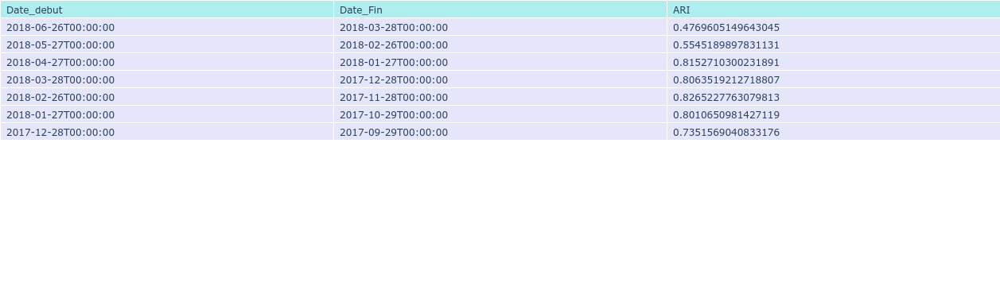

In [144]:
toplop=ari_score.columns
colplot=[toplop[0],toplop[1],toplop[2]]
dss=22
import plotly.graph_objects as go
fig = go.Figure(data=[go.Table(
    header=dict(values=list(colplot),
                fill_color='paleturquoise',
                align='left',
                height=dss),
    cells=dict(values=[ari_score[toplop[0]] ,ari_score[toplop[1]]  ,ari_score[toplop[2]]],
               fill_color='lavender',
               align='left',
               height=dss))
])
plt.rc('font', size=10) 
fig.update_layout(height=180,margin=dict(t=0,b=0,l=0,r=0))
fig.show()

figure_name='Freq_Maint.jpeg'
fig.write_image(figure_name)

!cp Freq_Maint.jpeg /home/yonss/AndroidStudioProjects/Dashboard/Images
!mv  Freq_Maint.jpeg  /home/yonss/Bureau/Data_scientist/Data_scientist/FIGURES/P5/

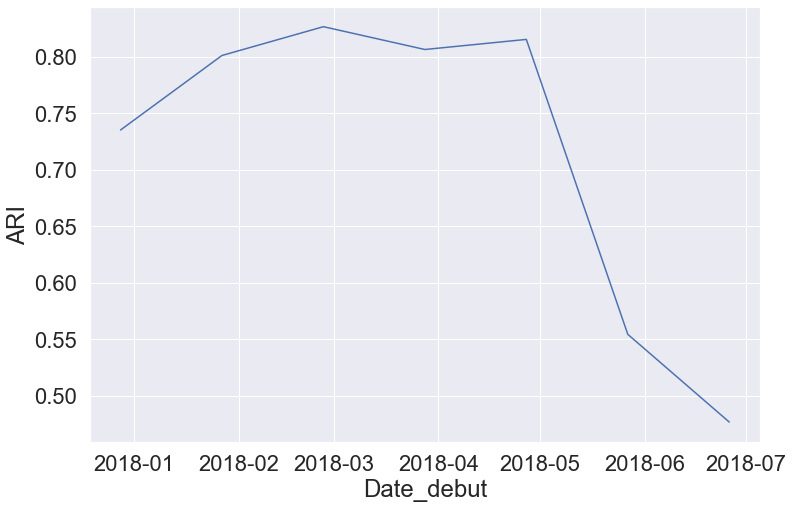

In [145]:
fig = plt.figure(figsize=(12,8))
sns.lineplot(data=ari_score, x="Date_debut", y="ARI")
plt.rc('font', size=10) 
plt.savefig('Frea_Maintenace.jpeg',format='jpeg',dpi=100,bbox_inches='tight')

!cp Frea_Maintenace.jpeg /home/yonss/AndroidStudioProjects/Dashboard/Images
!mv  Frea_Maintenace.jpeg /home/yonss/Bureau/Data_scientist/Data_scientist/FIGURES/P5/

### Remarque
On remarque que notre segmentation n'évolue pas dans le temps. On envisage de faire une maintenance de l'algorithme tous les 3 mois.

## DBSCAN

In [79]:
start = time.process_time()

var2drop=[name1]

df_merge_DB=copy.deepcopy(df_merge_RFM_DN)
df_merge_DB=df_merge_DB.drop(var2drop,axis=1)

X_col=df_merge_DB.columns

In [80]:
# min_samples determination
min_samples=df_merge_DB.shape[1]

possible_min_samples=[min_samples,2*min_samples]
print("Le nombre d'échantillons dans un voisinage = ", possible_min_samples)

Le nombre d'échantillons dans un voisinage =  [9, 18]


In [81]:
df_merge_DB.head()

,payment_value,review_score,DaysSinceOrder,DeliveryWaitingPeriod,review_creation_date,TimeSinceRevueCreation,Recence,Fréquence,Montant
0,1.24,0.63,0.83,2.82,-0.83,-0.82,0.83,1,1.24
1,0.51,-0.90,-0.12,0.02,0.56,0.49,-0.12,1,0.51
2,0.96,-0.90,-0.86,-1.12,1.02,0.37,-0.86,1,0.96
3,-0.34,-2.42,1.18,-0.14,-1.97,0.33,1.18,1,-0.34
4,0.51,0.63,0.79,0.48,-0.82,-0.40,0.79,1,0.51


La valeur optimale d'epsilon sera trouvée au point de courbure maximale qui est =  0.51


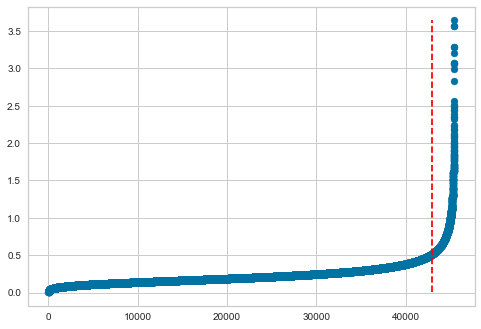

In [82]:
neighbors = NearestNeighbors(n_neighbors=2)
neighbors_fit = neighbors.fit(df_merge_DB)
distances, indices = neighbors_fit.kneighbors(df_merge_DB)
distances = np.sort(distances, axis=0)
distances = distances[:,1]

grad_search=pd.DataFrame(distances,columns=['distances'])
data=pd.DataFrame(grad_search.index,columns=['index'])
data['distances']=distances
from kneebow.rotor import Rotor
rotor = Rotor()
rotor.fit_rotate(data)

elbow_idx = rotor.get_elbow_index()

rotor.plot_elbow()
value_elbow=[]
for index, value in enumerate(data['distances']):
    if index==elbow_idx:
        value_elbow=round(value,2)
        print("La valeur optimale d'epsilon sera trouvée au point de courbure maximale qui est = ",value_elbow)

In [83]:
def dbscan_optimal_search(data,possible_eps,p_min_samples, no_clust):
    
    DB_data=pd.DataFrame(index=data.index)
    dbscan_clusters= pd.DataFrame(index=["eps", "sample", "clust", "noise"])  
    inx=0
    for samples in p_min_samples:
        for eps_val in possible_eps:
            db = DBSCAN(eps=eps_val, min_samples=samples) 
            DB_fit = db.fit_predict(data)
            labels = db.labels_
            name4='Clusters '+ str(samples) + str(eps_val)
            no_clusters = len(np.unique(labels) )
            no_noise    = np.sum(np.array(labels) == -1, axis=0)
            
            if no_clusters == no_clust:
                dbscan_clusters[name4]=[eps_val,samples,no_clusters,no_noise]
                DB_data[name4]=DB_fit
                print('Nombre estimé de clusters: %d' % no_clusters )
                print('Nombre minimum de echantillons: %d' % samples)
                print('Nombre estimé de points de bruit: %d' % no_noise)
                print('------------------------------------------------------')
    return DB_data, dbscan_clusters 

In [84]:
[DB_data, dbscan_clusters]=dbscan_optimal_search(df_merge_DB,np.arange(value_elbow/2,2*value_elbow,0.1),
                   np.arange(min_samples,3*min_samples,min_samples),nclusters)
end = time.process_time()

print(end - start)

Nombre estimé de clusters: 5
Nombre minimum de echantillons: 18
Nombre estimé de points de bruit: 3183
------------------------------------------------------
125.8743890159999


In [85]:
dbscan_clusters

,Clusters 180.7549999999999999
eps,0.75
sample,18.00
clust,5.00
noise,3183.00


In [86]:
dbscan_clusters.T.style.background_gradient(axis=None,cmap="coolwarm", subset=['noise'])
best=dbscan_clusters.T['noise'].idxmin(axis=1)

name4='Best cluster'
df_merge_DB[name4]=DB_data[str(best)]
df_merge_DB[name4] =DB_data[str(best)]

[36.13170661 61.34299777 75.23995261]


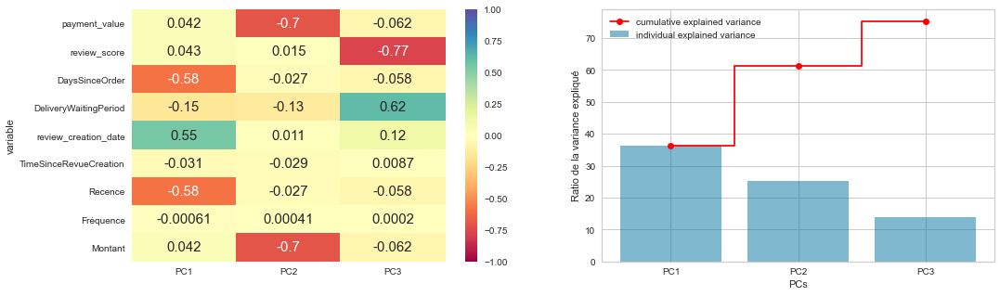

In [87]:
X_db=df_merge_DB.drop([name4],axis=1)
Y_db=df_merge_DB[name4].to_numpy()

figure_name =Path(str(dir_fig) +'/' + str('percentagen_explique.jpeg'))

[df_merge_DB_RD,pca_DB_RD] = \
                                        pca_dim_reduction(X_db,var_explaned,figure_name) 

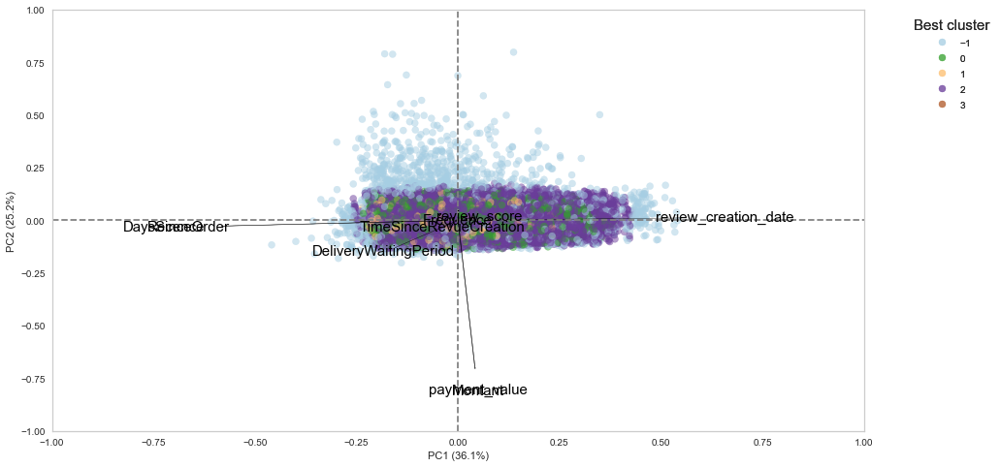

In [88]:
myplot(df_merge_DB_RD,df_merge_DB,name4, pca_DB_RD, \
       [0,1],boundary, alpha,'fig_PCA.jpeg',list(X_db.columns))

In [89]:
ARI_KMeans_KMeansDimRed_RFM_DN=adjusted_rand_score(Y_db,Y_RFM_DN)      #Y_train

ARI_KMeans_KMeansDimRed_DN=adjusted_rand_score(Y_db,Y_DN)      #Y_train

print(ARI_KMeans_KMeansDimRed_RFM_DN,ARI_KMeans_KMeansDimRed_DN)

0.10757255072050648 0.11401726453495914


### Mesure de similarité entre la repartition KMeans et dbscan

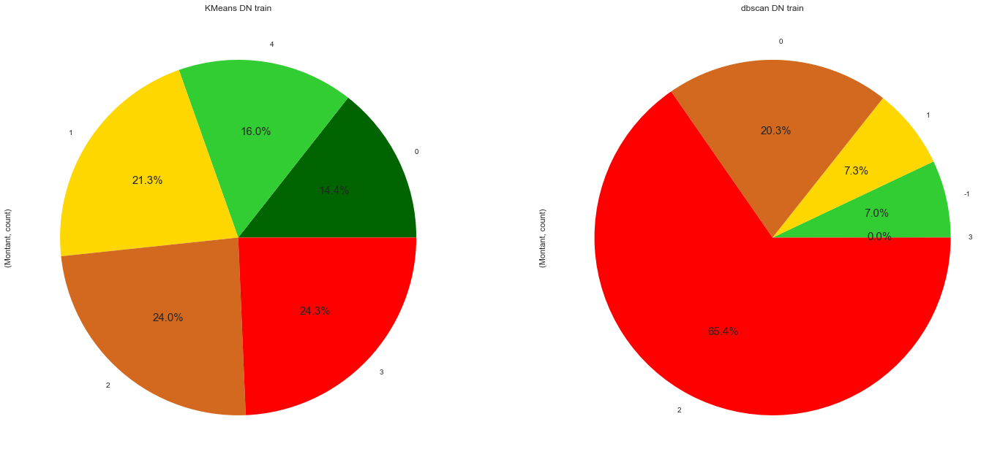

In [90]:
data_norm_RFM_DN= pd.DataFrame(df_merge_RFM_DN)
data_norm_agg_RFM_DN=copy.deepcopy(data_norm_RFM_DN)
data_norm_agg_RFM_DN = data_norm_agg_RFM_DN.groupby(name).agg({'Recence': 'mean','Fréquence': 'mean','Montant': 'mean'
                                               }).round(1)
data_norm_RFM_DN = data_norm_RFM_DN.groupby(name)
RFM_DN =data_norm_RFM_DN.agg({
    'Montant': ['mean', 'count']
  }).round(1)

data_norm_DB= pd.DataFrame(df_merge_DB)
data_norm_DB = df_merge_DB.groupby(name4)
DB=data_norm_DB.agg({
    'Montant': ['mean', 'count']
  }).round(1)

f, axes = plt.subplots(1,2, figsize=(24, 12))
# Tracer les clients par cluster K-Means
RFM_DN = RFM_DN.sort_values(by=('Montant','count'), ascending=True)
RFM_DN ['Montant','count'].plot(kind='pie',ax=axes[0],autopct='%1.1f%%', legend=False, colors=colors)
axes[0].set_title('KMeans DN train');


DB = DB.sort_values(by=('Montant','count'), ascending=True)
DB['Montant','count'].plot(kind='pie',ax=axes[1],autopct='%1.1f%%', legend=False, colors=colors)
axes[1].set_title('dbscan DN train');
plt.rc('font', size=15)   

In [91]:
var2drop=[name4]

df_merge_DB_best=copy.deepcopy(df_merge_DB)
df_merge_DB_best=df_merge_DB_best.drop(var2drop,axis=1)


In [92]:
# RFM_KMeans vs DN_KMeans
# Silhouette Score
ss1=[metrics.silhouette_score(df_merge_RFM_DN_best,df_merge_RFM_DN[name1]),\
     metrics.silhouette_score(df_merge_DN_best,df_merge_DN[name2]),\
     metrics.silhouette_score(df_merge_DB_best,df_merge_DB[name4])]
#
# Davies Bouldin Score
db1=[metrics.davies_bouldin_score(df_merge_RFM_DN_best,df_merge_RFM_DN[name1]),\
     metrics.davies_bouldin_score(df_merge_DN_best,df_merge_DN[name2]),\
     metrics.davies_bouldin_score(df_merge_DB_best,df_merge_DB[name4])]

In [93]:
algorithms1=["K-Means RFM + DN","K-Means DN","DBSCAN DN"]

comprsn_DN={"Algorithms":algorithms1,"Davies Bouldin":db1,"Silhouette Score":ss1}
compdf_DN=pd.DataFrame(comprsn_DN)
display(compdf_DN.sort_values(by=["Silhouette Score"], ascending=False))

,Algorithms,Davies Bouldin,Silhouette Score
0,K-Means RFM + DN,1.46,0.18
1,K-Means DN,1.69,0.16
2,DBSCAN DN,3.17,0.05


### Remarques
Le KMeans a le meilleur score de Silhouette et Davies Bouldin. DBscan considère que 3183 données etant du bruits.

## Clustering avec l'algorithme du K-Prototypes


In [94]:
start = time.process_time()
var2drop=[name]
cat=['payment_type', 'product_category_name']
df_merge_KP=copy.deepcopy(df_merge_RFM_DN)

df_merge_KP=df_merge_KP.drop(var2drop,axis=1)
df_merge_KP[cat[0]]=df_merge_RFM[cat[0]]
df_merge_KP[cat[1]]=df_merge_RFM[cat[1]]

# Get the position of categorical columns
catColumnsPos = [df_merge_KP.columns.get_loc(col) for col in list(df_merge_KP.select_dtypes('object').columns)]

print('Categorical columns           : {}'.format(list(df_merge_KP.select_dtypes('object').columns)))
print('Categorical columns position  : {}'.format(catColumnsPos))


Categorical columns           : ['payment_type', 'product_category_name']
Categorical columns position  : [9, 10]


In [95]:
model= KPrototypes(n_clusters=nclusters, init='Huang',
                         random_state=rstate)
df_merge_KP['cluster_5_KP']=model.fit_predict(df_merge_KP, categorical=catColumnsPos)

end = time.process_time()

print(end - start)

3812.631106946


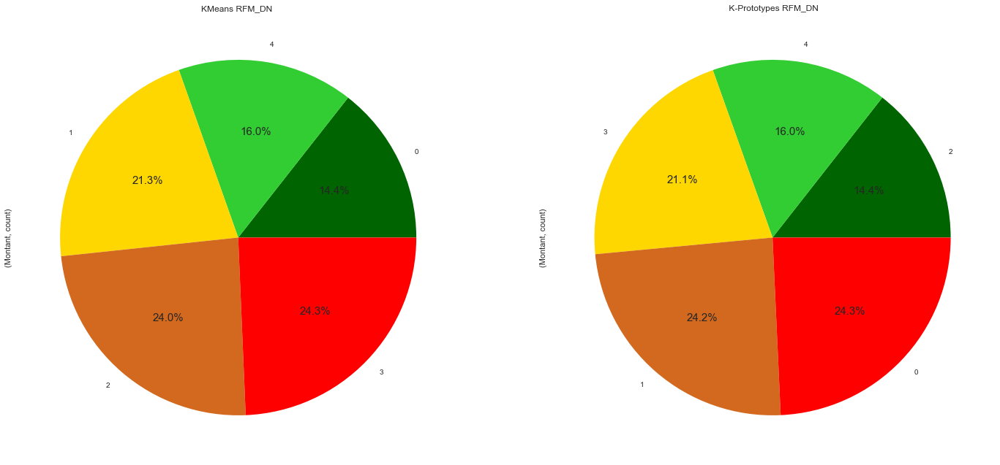

In [96]:

df_RFM_DN_KP = df_merge_KP.groupby('cluster_5_KP')
RFM_DN_KP=df_RFM_DN_KP.agg({
    'Montant': ['mean', 'count']
  }).round(1)

f, axes = plt.subplots(1,2, figsize=(24, 12))
# Tracer les clients par cluster K-Means
RFM_DN = RFM_DN.sort_values(by=('Montant','count'), ascending=True)
RFM_DN ['Montant','count'].plot(kind='pie',ax=axes[0],autopct='%1.1f%%', legend=False, colors=colors)
axes[0].set_title('KMeans RFM_DN ');


RFM_DN_KP = RFM_DN_KP.sort_values(by=('Montant','count'), ascending=True)
RFM_DN_KP['Montant','count'].plot(kind='pie',ax=axes[1],autopct='%1.1f%%', legend=False, colors=colors)
axes[1].set_title(' K-Prototypes RFM_DN');
plt.rc('font', size=20)  


plt.savefig('PIE_DN_RFM_KP_KMeans.jpeg',format='jpeg',dpi=100,bbox_inches='tight')

  

### Remarque 
K-Prototypes a un temps de calcule élevé en comparaison avec Kmeans pour un résultat similaire

## Data analysis

In [97]:
list2include=['payment_type','product_category_name','customer_city','customer_state','customer_id']
df_merge_RFM_DN[list2include]=df_merge_RFM[list2include]

In [98]:
kiviat= pd.DataFrame(df_merge_RFM_DN)
kiviat=copy.deepcopy(kiviat)
kiviat = kiviat.groupby(name).agg({'Recence': 'mean','Fréquence': 'mean','Montant': 'mean'
                                               }).round(1)


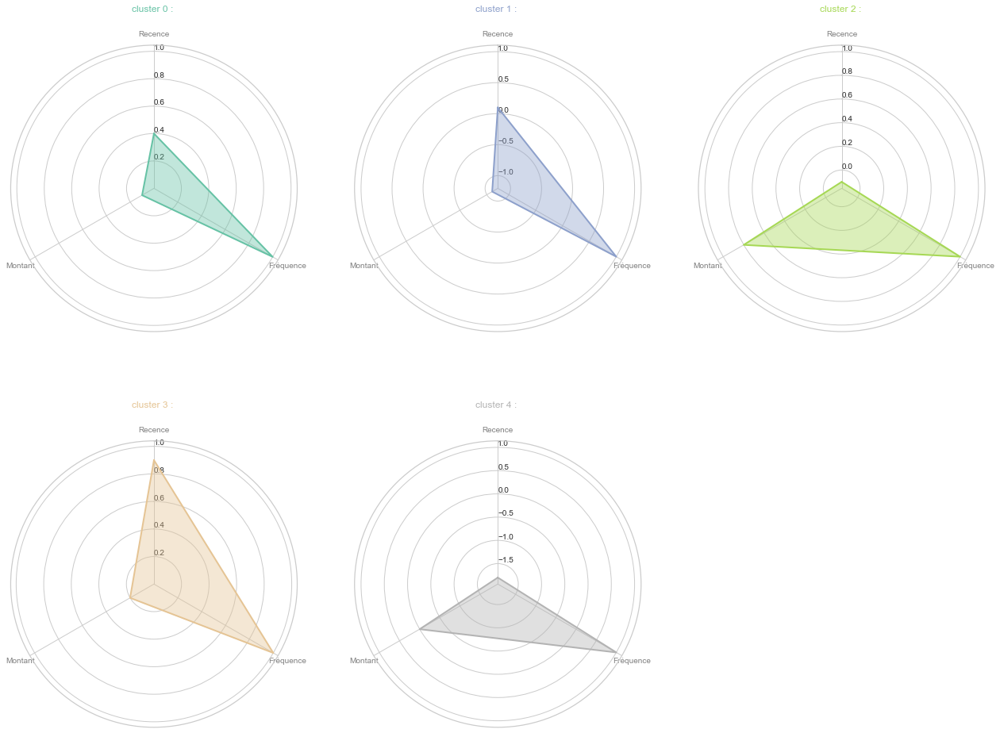

In [99]:
def make_spider( row, title, color):

    # number of variable
    categories=list(kiviat)
    N = len(categories)

    # What will be the angle of each axis in the plot? (we divide the plot / number of variable)
    angles = [n / float(N) * 2 * np.pi for n in range(N)]
    angles += angles[:1]

    # Initialise the spider plot
    ax = plt.subplot(3,3,row+1, polar=True, )

    # If you want the first axis to be on top:
    ax.set_theta_offset(np.pi / 2)
    ax.set_theta_direction(-1)

    # Draw one axe per variable + add labels labels yet
    plt.xticks(angles[:-1], categories, color='grey')

    # Draw ylabels
    ax.set_rlabel_position(0)

    # Ind1
    values=kiviat.loc[row].values.flatten().tolist()
    values += values[:1]
    ax.plot(angles, values, color=color, linewidth=2, linestyle='solid')
    ax.fill(angles, values, color=color, alpha=0.4)

    # Add a title
    title += ' : '
    plt.title(title, color=color, y=1.1)
    plt.rc('font', size=10) 
# ------- PART 2: Apply the function to all individuals
# initialize the figure
plt.figure(figsize=(22, 26))
 
# Create a color palette:
my_palette = plt.cm.get_cmap("Set2", len(kiviat.index))
 
# Loop to plot
for row in range(0, len(kiviat.index)):
    make_spider( row=row, title='cluster '+str(row), color=my_palette(row))

plt.savefig('radar_analyse.jpeg',format='jpeg',dpi=100,bbox_inches='tight')

!cp radar_analyse.jpeg /home/yonss/AndroidStudioProjects/Dashboard/Images
!mv radar_analyse.jpeg   /home/yonss/Bureau/Data_scientist/Data_scientist/FIGURES/P5/

      

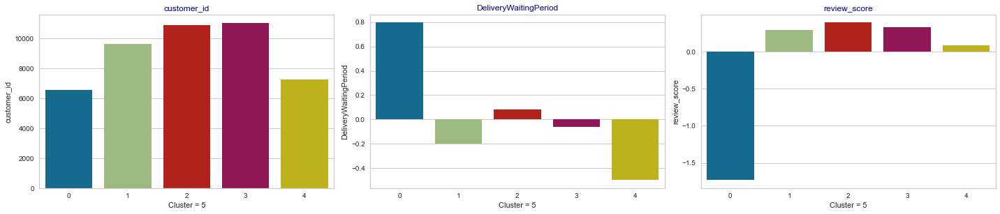

In [100]:
features=['customer_id',"DeliveryWaitingPeriod",'review_score']
plt.figure(figsize=(20,12))
for i,j in enumerate(features):
    if j=='customer_id':
        grouped=df_merge_RFM_DN.groupby(by="Cluster = 5").count()
    else:
        grouped=df_merge_RFM_DN.groupby(by="Cluster = 5").mean()
    plt.subplot(3,3,i+1)
    sns.barplot(grouped.index,grouped[j])
    plt.title(j,fontdict={'color':'darkblue'})
plt.tight_layout()
plt.rcParams['font.size'] = '20'
plt.savefig('bra1.jpeg',format='jpeg',dpi=100,bbox_inches='tight')

!cp bra1.jpeg /home/yonss/AndroidStudioProjects/Dashboard/Images
!mv  bra1.jpeg   /home/yonss/Bureau/Data_scientist/Data_scientist/FIGURES/P5/

         

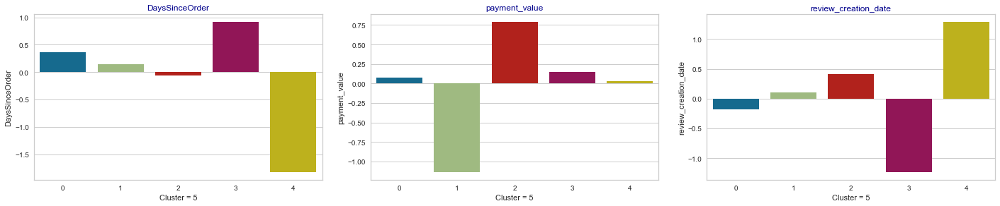

In [101]:
features=["DaysSinceOrder","payment_value","review_creation_date"]
plt.figure(figsize=(20,12))
for i,j in enumerate(features):
    grouped=df_merge_RFM_DN.groupby(by="Cluster = 5").mean()
    plt.subplot(3,3,i+1)
    sns.barplot(grouped.index,grouped[j])
    plt.title(j,fontdict={'color':'darkblue'})
plt.tight_layout()
plt.rcParams['font.size'] = '20'
plt.savefig('bra2.jpeg',format='jpeg',dpi=100,bbox_inches='tight')

!cp bra2.jpeg /home/yonss/AndroidStudioProjects/Dashboard/Images
!mv  bra2.jpeg   /home/yonss/Bureau/Data_scientist/Data_scientist/FIGURES/P5/

 

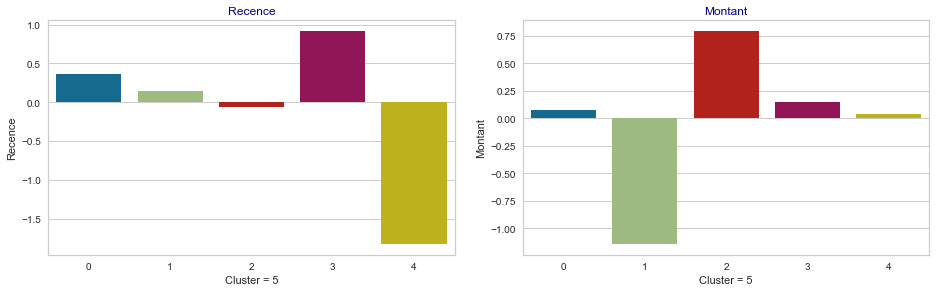

In [102]:
features=['Recence','Montant']
plt.figure(figsize=(20,12))
for i,j in enumerate(features):
    if j=='customer_id':
        grouped=df_merge_RFM_DN.groupby(by="Cluster = 5").count()
    else:
        grouped=df_merge_RFM_DN.groupby(by="Cluster = 5").mean()
    plt.subplot(3,3,i+1)
    sns.barplot(grouped.index,grouped[j])
    plt.title(j,fontdict={'color':'darkblue'})
plt.tight_layout()
plt.rcParams['font.size'] = '20'
plt.savefig('bra3.jpeg',format='jpeg',dpi=100,bbox_inches='tight')

!cp bra3.jpeg /home/yonss/AndroidStudioProjects/Dashboard/Images
!mv  bra3.jpeg   /home/yonss/Bureau/Data_scientist/Data_scientist/FIGURES/P5/


<b>Cluster 2 :</b>   Premier cluster ayant le plus grand nombre de clients. La récence la plus élevée mais la valeur du paiement la plus faible <b>- Lost</b>\
<b>Cluster 1 :</b> Deuxième cluster ayant le plus grand nombre de clients et la plus grande valeur de paiement  <b>- Champions</b>  \
<b>Cluster 0 :</b> Ce groupe a le plus grand nombre de clients et la plus faible récence <b>- Loyal</b>\
<b>Cluster 4 :</b> Troisième cluster ayant le plus grand nombre de clients, mais la valeur du paiement la plus faible <b>-  Need attention </b>\
<b>Cluster 3 :</b> Le plus petit nombre de clients se trouve dans ce groupe, qui se situe au-dessus de la moyenne en termes de récence et de valeur de paiement <b>- At risk</b>


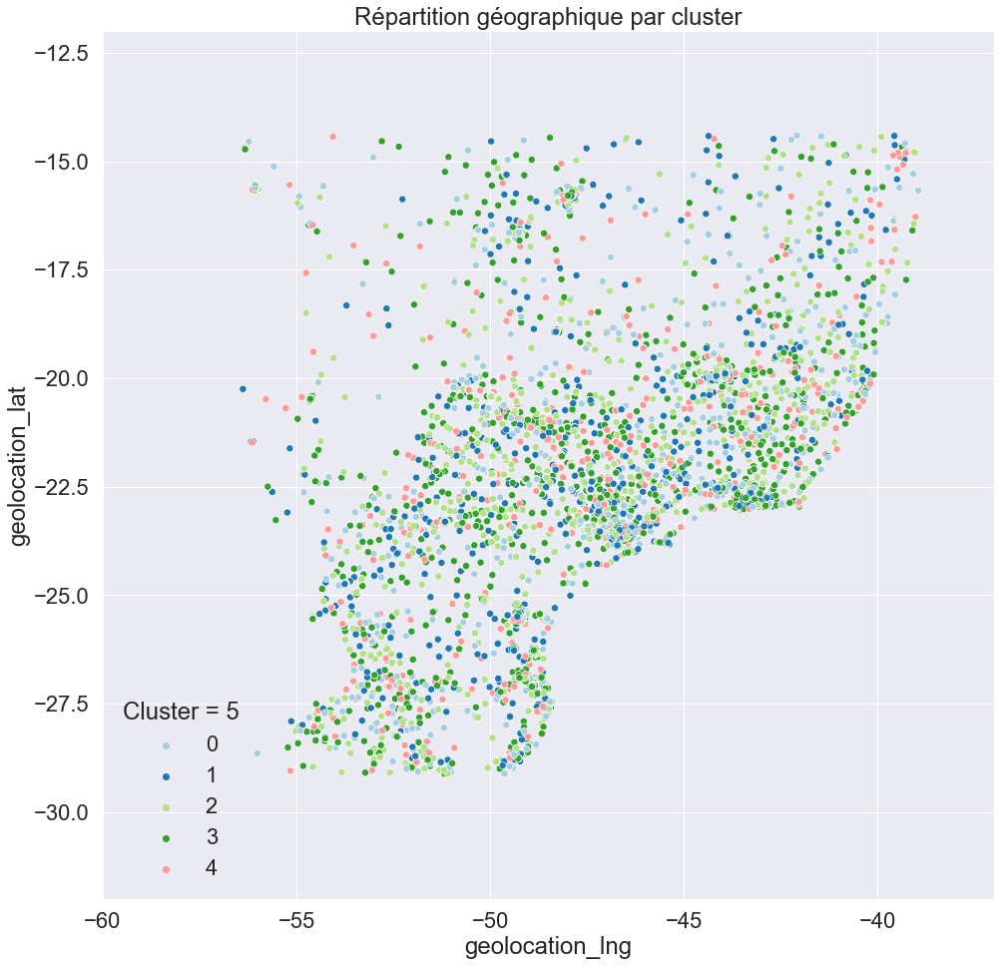

In [103]:
M_RFM_DN=copy.deepcopy(df_merge_RFM_DN)
M_RFM_DN['geolocation_lat']=df_merge_RFM['geolocation_lat']
M_RFM_DN['geolocation_lng']=df_merge_RFM['geolocation_lng']

c=M_RFM_DN[name]
plt.figure(figsize=(16,16))
sns.set(font_scale=2)
sns.scatterplot(x='geolocation_lng', y='geolocation_lat', data=M_RFM_DN, hue=name , palette='Paired',s=50, alpha=1)
plt.xlim(-60,-37)
plt.ylim(-32,-12)
plt.title('Répartition géographique par cluster')
plt.savefig('map_bra.jpeg',format='jpeg',dpi=100,bbox_inches='tight')

!cp map_bra.jpeg /home/yonss/AndroidStudioProjects/Dashboard/Images
!mv map_bra.jpeg   /home/yonss/Bureau/Data_scientist/Data_scientist/FIGURES/P5/

plt.show()


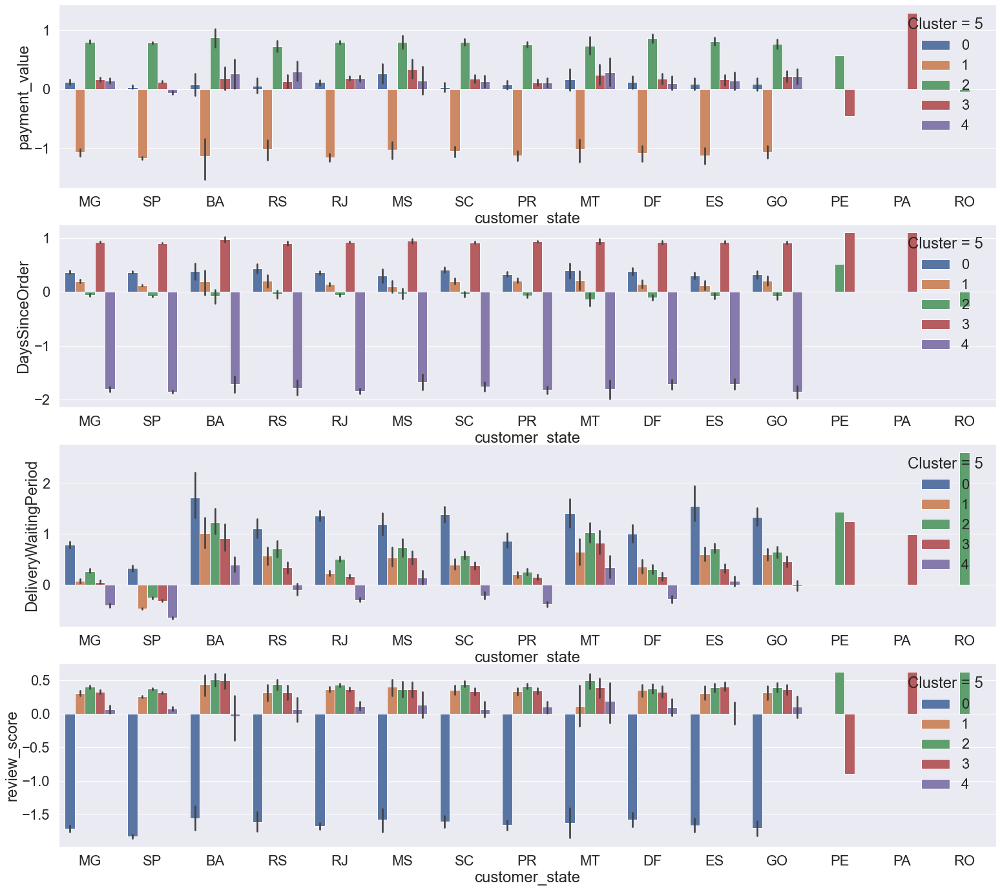

In [104]:
x="customer_state"
features=["payment_value","DaysSinceOrder","DeliveryWaitingPeriod","review_score"]
fig, axs = plt.subplots (4,1, figsize=(26, 24))
for i,j in enumerate(features):
    sns.barplot(x=x, y=j, hue="Cluster = 5", data=df_merge_RFM_DN,ax=axs[i])
    
    plt.rcParams['font.size'] = '20'

Le comportement des clients ne varie pas d'une region à l'autre

## Sommaire

- Segmentation RFM ne semble pas adapte pour faire la repartition des clients pour Olist
- Segmentation peut etre amélioré avec la méthode des kmeans
- On envisage de faire une maintenance de l'algorithme tous les 3 mois.